<a href="https://colab.research.google.com/github/pitapatat/Data_Analysis_Visualization/blob/main/%5BDA%5D_youtube_analysis_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### (데이터 분석을 위한) 라이브러리 설치

* 한글 깨짐 방지

In [1]:
!apt-get update -qq
!apt-get install fonts-nanum* -qq

In [2]:
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
sys_font = fm.findSystemFonts()

[f for f in sys_font if 'Nanum' in f]

['/usr/share/fonts/truetype/nanum/NanumSquareRoundB.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicExtraBold.ttf',
 '/usr/share/fonts/truetype/nanum/NanumSquareRoundR.ttf',
 '/usr/share/fonts/truetype/nanum/NanumSquareRoundEB.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicEco.ttf',
 '/usr/share/fonts/truetype/nanum/NanumPen.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicLight.ttf',
 '/usr/share/fonts/truetype/nanum/NanumBarunpenB.ttf',
 '/usr/share/fonts/truetype/nanum/NanumBrush.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicEcoBold.ttf',
 '/usr/share/fonts/truetype/nanum/NanumBarunGothicUltraLight.ttf',
 '/usr/share/fonts/truetype/nanum/NanumMyeongjoBold.ttf',
 '/usr/share/fonts/truetype/nanum/NanumBarunGothicLight.ttf',
 '/usr/share/fonts/truetype/nanum/NanumSquareB.ttf',
 '/usr/share/fonts/truetype/nanum/NanumMyeongjoExtraBold.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicCoding-Bold.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicCoding.ttf',
 '/usr/share/f

In [3]:
pip install --upgrade matplotlib

In [113]:
path = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
font_name = fm.FontProperties(fname=path, size = 10).get_name()
print(font_name)
plt.rc('font', family=font_name)
#fm._rebuild()

NanumBarunGothic


In [5]:
# 시각화 모듈 임포트
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
from matplotlib import font_manager, rc

# colab 내 그래프를 바로 그리기 위한 설정
%matplotlib inline

# unicode minus를 사용하지 않기 위한 설정 (minus 깨짐현상 방지)
plt.rcParams['axes.unicode_minus'] = False

# font 적용
plt.rc('font', family = 'NanumBarunGothic')

# ggplot 으로 그래프 스타일 설정
plt.style.use('ggplot')

# 레티나 설정 : 글자가 흐릿하게 보이는 현상 방지
%config InlineBackend.figure_format = 'retina'

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
import pandas as pd
import numpy as np

import missingno as msno

%matplotlib inline
import seaborn as sns
import matplotlib as mpl

mpl.rc("font", family='Malgun Gothic')
mpl.rc('axes', unicode_minus=False)
plt.rc('font', family = 'NanumBarunGothic')


%config InlineBackend.figure_format='retina'

import warnings
warnings.filterwarnings('ignore')
from datetime import datetime

#   ▣ YOUTUBE 인기동영상 데이터 분석

 1. 기간에 따른 데이터 시각화
> - 전체 카테고리에 따른 채널별 비디오 개수
> * 월별 카테고리에 따른 채널 비디오 개수
> * 월별 TOP10 채널
> * 주별 TOP5 채널
> * 월별 카테고리별 태그 키워드 순위

 2. 인기동영상으로 분류할 수 있는 새로운 지표 개발
> * 시청자의 호응도를 판단할 수 있은 지표(likes, dislikes, commnets ..)들과 조회수와의 연관성 분석
> * 인기동영상 분류 기준에 부합할 수 있는 새로운 feature 개발  

### Ⅰ 데이터 전처리

##### 1) 데이터 불러오기

In [8]:
data = pd.read_csv('/content/drive/MyDrive/pretest_data.csv')
data.head(3)
data.shape  #(2644,25)

(2644, 25)

In [9]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
on_rank,2644.0,2.023449e+01,1.283312e+01,1.0,9.00,19.0,3.000000e+01,5.000000e+01
off_rank,2644.0,3.579539e+01,1.037675e+01,1.0,28.00,37.0,4.500000e+01,5.000000e+01
on_views,2644.0,9.534819e+05,3.200375e+06,0.0,235352.00,427924.5,8.268800e+05,9.727667e+07
off_views,2644.0,1.432732e+06,6.836354e+06,0.0,306854.00,571508.0,1.119499e+06,2.488763e+08
on_likes,2644.0,5.465813e+04,3.239337e+05,0.0,4208.50,7851.0,1.688350e+04,8.097173e+06
off_likes,2644.0,6.845384e+04,4.983217e+05,0.0,4932.75,9507.0,2.085950e+04,1.575992e+07
on_dislikes,2644.0,5.342799e+02,2.070643e+03,0.0,86.00,159.0,3.150000e+02,3.734900e+04
off_dislikes,2644.0,8.604024e+02,4.754238e+03,0.0,108.00,211.0,4.350000e+02,1.337210e+05
on_comments,2644.0,9.032085e+03,1.155321e+05,0.0,511.00,1157.0,2.720000e+03,4.625133e+06
off_comments,2644.0,1.111202e+04,1.574601e+05,0.0,597.75,1311.5,3.150750e+03,6.659938e+06


In [10]:
data.describe(include = 'object').T   # null_columns : tags, description 

,count,unique,top,freq
video_id,2644,2643,VBSBm,2
channel_id,2644,940,CHQ2O-i,17
published_date,2644,127,2021-05-14,33
category_name,2644,15,Entertainment,954
duration,2644,1200,PT8M1S,17
tags,2274,1978,파뿌리|예능|게임|GAME|오락|버라이어티|variety|웹예능|플레이,14
description,2604,2492,Connect with BTS: https://ibighit.com/bts http...,10
on_trending_date,2644,127,2021-04-10,33
off_trending_date,2644,122,2021-07-31,50


##### 2) 데이터 전처리

> ① 데이터 결측치 확인

    - tags, description 일부 누락(영상에 미작성된 것으로 파악)
    - numerical data는 결측치 없음
    - tags, description 모두 null인 경우: 18 rows
        - category별 결측치 
            : people & blogs(13) >>> entertainment(4) > sports(1)

> ② columns의 타입 변경

    - date column 값을 to_datetime 변경 후 month, week 추출 
        -> 월별, 주별 데이터 분석
    

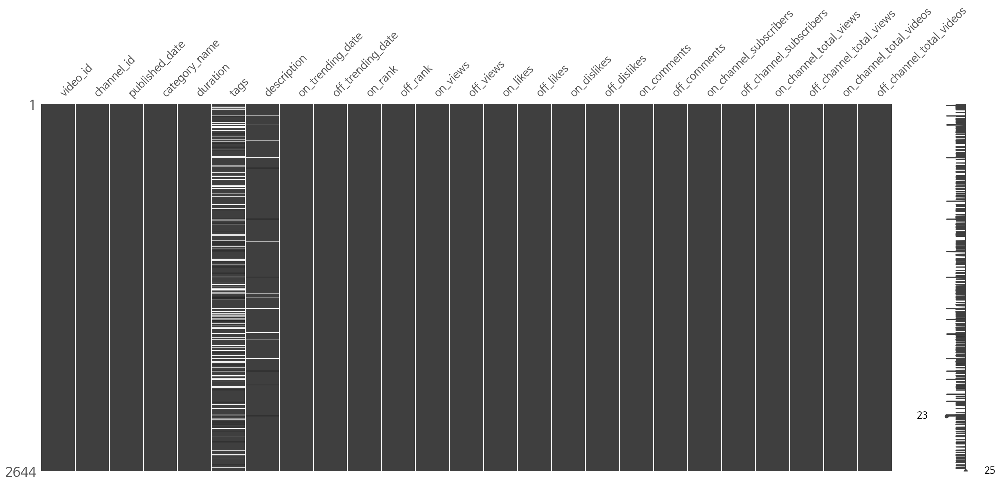

In [11]:
msno.matrix(data);

In [12]:
data[(data['tags'].isnull()== True) & (data['description'].isnull()== True)]  

,video_id,channel_id,published_date,category_name,duration,tags,description,on_trending_date,off_trending_date,on_rank,...,on_dislikes,off_dislikes,on_comments,off_comments,on_channel_subscribers,off_channel_subscribers,on_channel_total_views,off_channel_total_views,on_channel_total_videos,off_channel_total_videos
9,V-DeS,CHUXYT0,2021-05-15,Entertainment,PT59M18S,NaN,NaN,2021-05-18,2021-05-19,7,...,357,373,3406,3508,172000,215000,83802043,83802043,1193,1195
86,V1Cfz,CHkkWd0,2021-04-27,People & Blogs,PT7M20S,NaN,NaN,2021-04-29,2021-05-01,4,...,301,767,3036,4514,68700,144000,75036,827352,1,2
151,V2uYL,CHkkWd0,2021-04-29,People & Blogs,PT3M27S,NaN,NaN,2021-04-30,2021-05-03,1,...,231,645,0,0,110000,184000,295398,1999077,2,2
387,V8835,CHqNN-b,2021-07-17,People & Blogs,PT31S,NaN,NaN,2021-07-21,2021-07-21,47,...,478,478,484,484,132000,132000,79628006,79628006,89,89
699,VFKKd,CHIG4gr,2021-05-26,People & Blogs,PT17M12S,NaN,NaN,2021-05-28,2021-05-29,31,...,1101,1268,7929,8243,2220000,2220000,595641727,596836669,393,393
829,VHy0c,CHPZ4e8,2021-06-15,People & Blogs,PT21M51S,NaN,NaN,2021-06-17,2021-06-18,24,...,106,167,1024,1094,814000,814000,173434070,173742317,299,301
1064,VNobj,CH47HAk,2021-04-20,People & Blogs,PT4M32S,NaN,NaN,2021-04-23,2021-04-23,34,...,9748,9748,11838,11838,1210000,1210000,412705,412705,1,1
1247,VS_DL,CHCJ2b2,2021-06-08,People & Blogs,PT1M7S,NaN,NaN,2021-06-10,2021-06-12,4,...,1625,2474,2955,3664,120000,123000,4531414,5524026,18,18
1473,VYdD2,CH2Q9aM,2021-05-03,People & Blogs,PT8S,NaN,NaN,2021-05-05,2021-05-07,13,...,517,711,9678,11388,2320,3000,2360146,4031109,4,4
1550,V_kMS,CHET3I7,2021-05-19,People & Blogs,PT46M26S,NaN,NaN,2021-05-21,2021-05-21,33,...,56,56,757,757,1240000,1240000,41998156,41998156,32,32


In [13]:
df = data.copy()
## type
# columns - 'date' 
date_cols = data.columns[data.columns.str.contains('date')]
on_cols = data.columns[data.columns.str.contains('on_')]
off_cols = data.columns[data.columns.str.contains('off_')]

In [14]:
# datetime 
for col in date_cols:
    df[col] = pd.to_datetime(df[col], format = '%Y-%m-%d')

## Ⅱ 카테고리별 채널별 비디오 개수


### 1. 전체 카테고리별 채널

#### 1-1. 카테고리별 채널의 비디오 개수
> * entertainment의 비중이 전체의 36%로 압도적임
> * entertainment(36%), people & blogs(16%), music(9%), sports(8%)의 순으로 나타나며 그 뒤를 comedy(6%), news & politics(6%), howto & style(4.5%), gaming(3%)이 따름


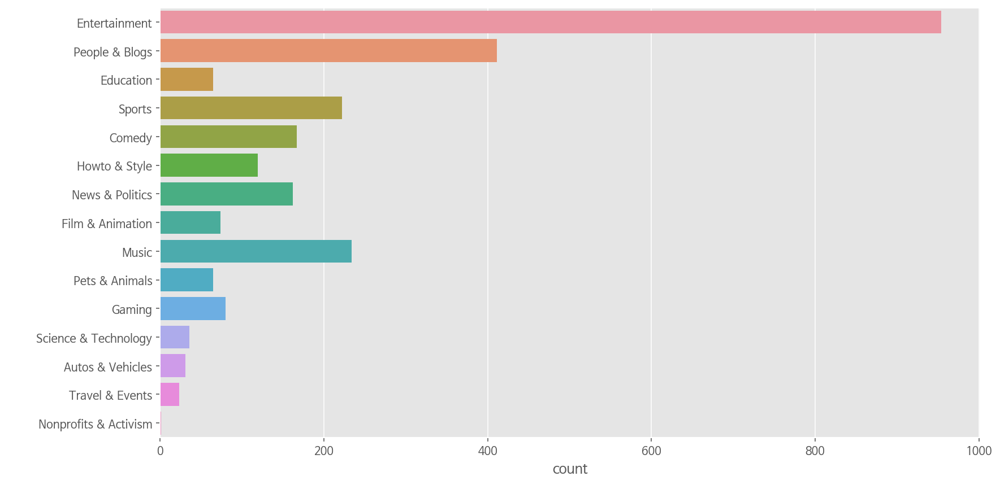

In [15]:
df = df.set_index('published_date').sort_index()
#df.head(3)

## 전체 카테고리별 채널 수 
#df.groupby(['category_name'])['channel_id'].count()
plt.figure(figsize = (13,7))
sns.countplot(data = df, y = df.category_name)
plt.ylabel(" ",labelpad = 12)
plt.show();

In [16]:
## 인기동영상의 카테고리별 분포
df.category_name.value_counts(normalize = True)

Entertainment            0.360817
People & Blogs           0.155446
Music                    0.088502
Sports                   0.083964
Comedy                   0.063162
News & Politics          0.061271
Howto & Style            0.045008
Gaming                   0.030257
Film & Animation         0.027988
Education                0.024584
Pets & Animals           0.024584
Science & Technology     0.013616
Autos & Vehicles         0.011725
Travel & Events          0.008699
Nonprofits & Activism    0.000378
Name: category_name, dtype: float64

#### 1-2.전체 (daily) 카테고리별 채널의 추이



In [17]:
daily_pivot = df.pivot_table(index = [df.index, 'category_name'],values = ['channel_id'],aggfunc = ['count'], fill_value= 0)
daily = daily_pivot.unstack()
daily.columns = [daily.columns[i][2] for i in range(df.category_name.nunique())]

## daily 카테고리별 비디오 개수
#daily_pivot

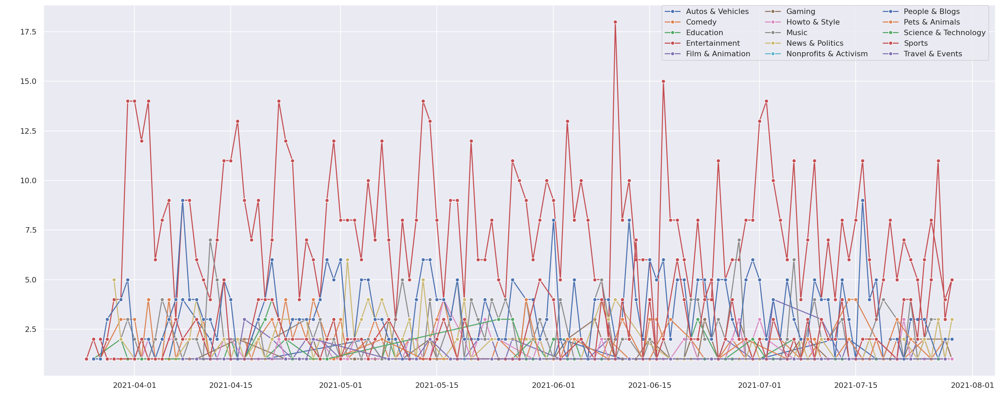

In [18]:
plt.figure(figsize = (25,10))
sns.set_theme(color_codes = True)

for i in range(15):
    sns.lineplot(data = daily, x = daily.index, y = daily.columns[i], 
                 label = daily.columns[i], marker = 'H' )
    cmap = sns.color_palette("Paired")
    #plt.title("number of channel by category")
    plt.xlabel(" ", labelpad = 10)
    plt.ylabel(" ", labelpad = 10)
    #plt.xlim([2.9,7.1])
    plt.legend(loc = (0.65,0.85), fontsize = 11, frameon = True, ncol = 3)
    #lt.xticks(np.arange(3,8,1), ['March', 'April', 'May', 'June','July'])

plt.show()

### 2. 월별 카테고리별 채널

#### 2-1. 월별 카테고리별 채널 
>    - 분석 기간: 3/25 ~7/29
>    - 일별 인기동영상 채널은 최소(min) 1개, 최대(max) 33개의 동영샹으로 구성되며, 하루 평균(mean) 21개의 인기동영상 데이터로 이루어짐
>    - 분석 방법: datetime.month를 기준으로 월별 분류 후, 카테고리별 채널의 개수 분석
>    - 특이점 
> * 3월: 1주일치(3/25 -3/31)의 데이터만 존재하므로 월별 비디오 개수(총계) = 74개
    * 4월 - 6월: 650개 이상 
    * 7월:  584개 


In [19]:
# 일별 인기동영상 데이터 구성
df.groupby([df.index])['channel_id'].count()
# 하루 평균 인기동영상 = 21
df.groupby([df.index])['channel_id'].count().mean()

20.818897637795274

In [20]:
## 월별 비디오 수(total)
df.resample('M')['category_name'].count()

published_date
2021-03-31     74
2021-04-30    675
2021-05-31    656
2021-06-30    655
2021-07-31    584
Freq: M, Name: category_name, dtype: int64

In [21]:
## 월별 카테고리별 채널 수
monthly_pivot = df.pivot_table(index = [df.index.month, 'category_name'],values = ['channel_id'], 
                               aggfunc = ['count'], fill_value= 0)
monthly = monthly_pivot.unstack()
monthly.columns = [monthly.columns[i][2] for i in range(df.category_name.nunique())]

In [22]:
#monthly_pivot

#### 2-2. 월별 (전체)카테고리별 채널별 비디오 개수(추이)
> - 1,2위는 entertainment, people&blogs 순으로 구성되며, 특히 entertainment가 차지하는 비중이 압도적이며 뒤를 따라 music, news, comedy, sports, howto & style 이 상위권에 랭크됨
>- 특징 : sports 채널
>  - sports 분야의 영상은 전월에 비해 6월 인기동영상에 오른 영상이 많음 
>        - (+) 6월의 관련 tag를 보면 카타르월드컵 예선, euro 2020 유로16강이 다수를 차지함
>        - 스포츠 시즌에 따른 일시적 증가현상으로 볼 수 있음
>   - 축구 외에는 골프, 헬스 영상이 포함
>        - (+) 7월의 관련 tag를 보면 격투기, 축구, 골프 다양하게 주제가 구성되며 도쿄올림픽(7월말) 시즌에 따라 관련한 올림픽 영상이 상당히 포함

     

In [23]:
## 6월 이후 sports 카테고리 tags
#df.tags[(df.index.month == 7) & (df.category_name == 'Sports')].values

In [24]:
'''
## 월별 카테고리별 채널별 비디오 개수(표)
for i in range(3,8):
    print("="*5 + f'{i}월'+ "="*5)
    print(monthly.loc[i].sort_values(ascending = False))
    print("======"*30)
'''

'\n## 월별 카테고리별 채널별 비디오 개수(표)\nfor i in range(3,8):\n    print("="*5 + f\'{i}월\'+ "="*5)\n    print(monthly.loc[i].sort_values(ascending = False))\n    print("======"*30)\n'

In [25]:
#monthly.iloc[0]

#### 월별 카테고리별 채널 분포 현황

====================     Month:3     ============================================================


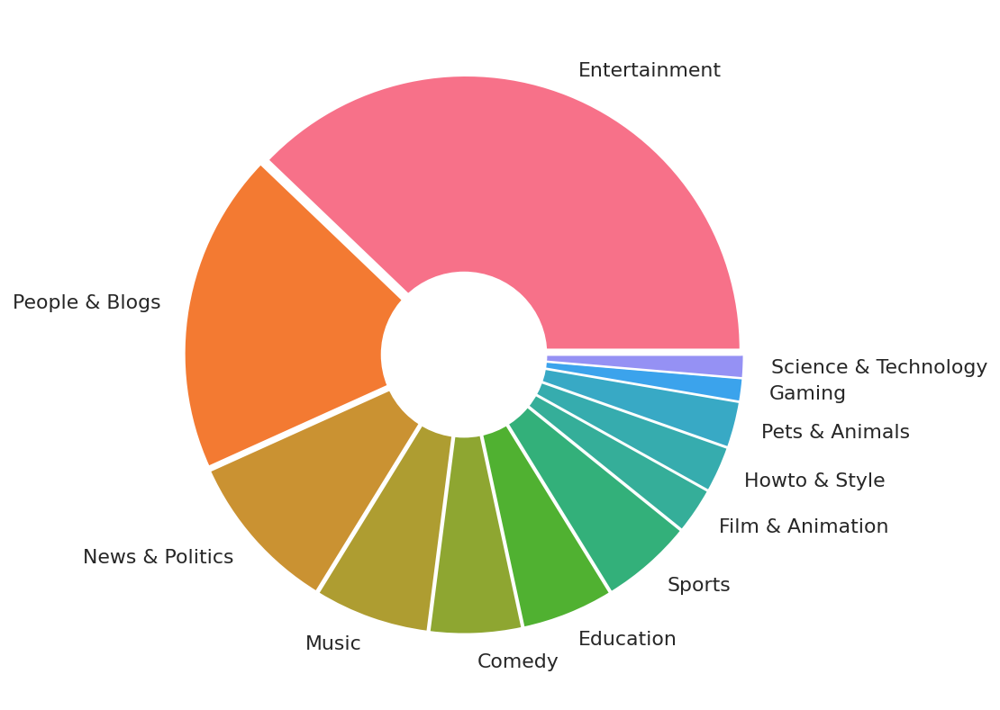

====================     Month:4     ============================================================


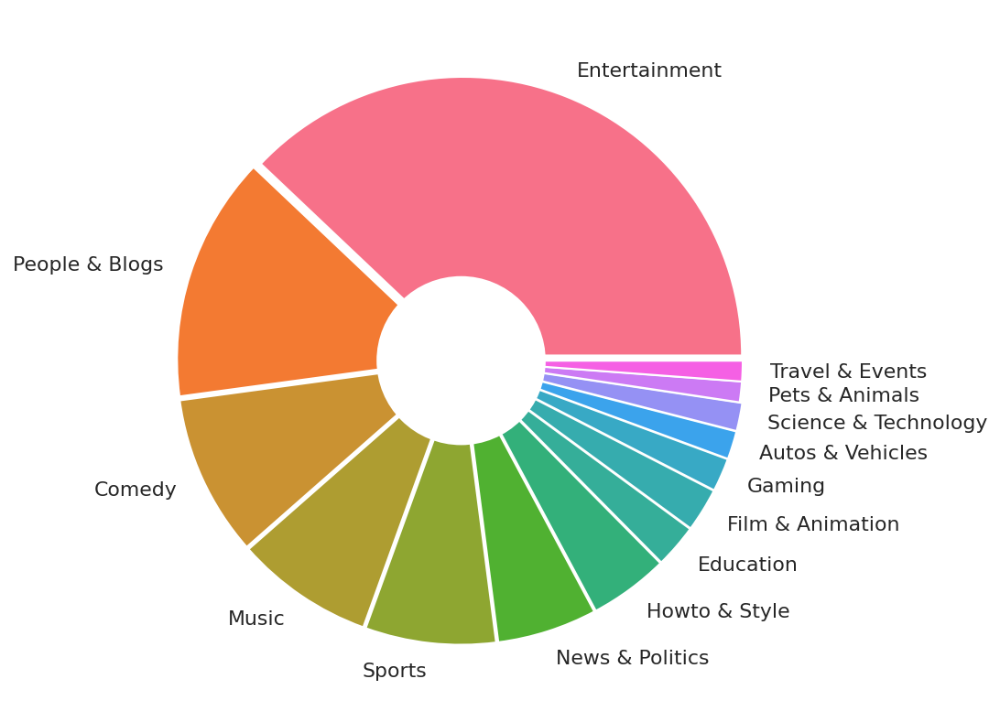

====================     Month:5     ============================================================


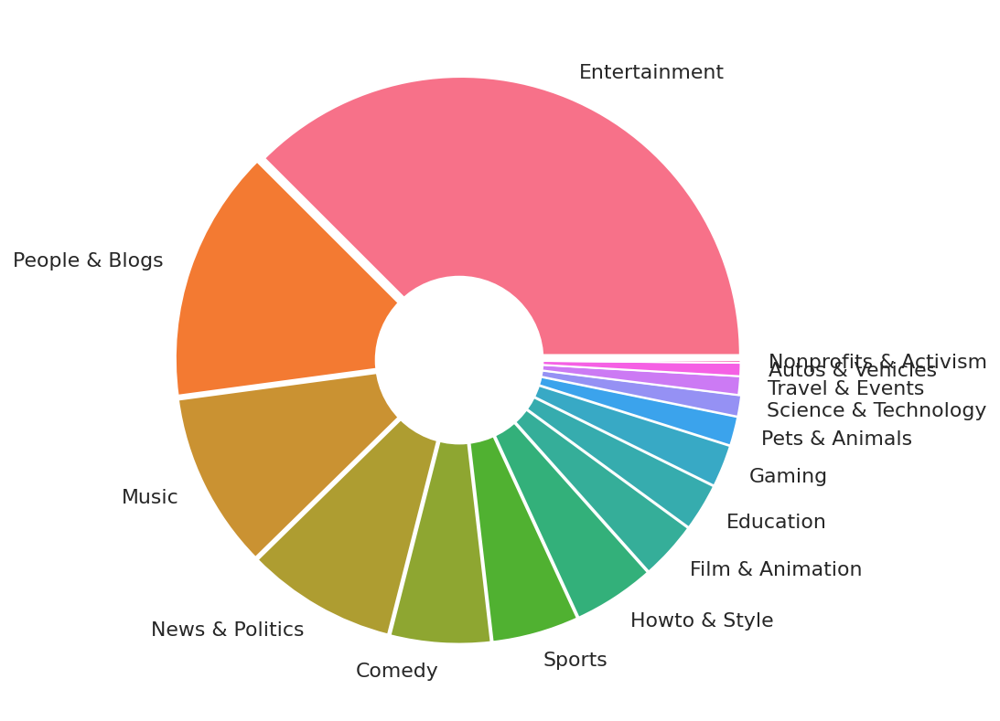

====================     Month:6     ============================================================


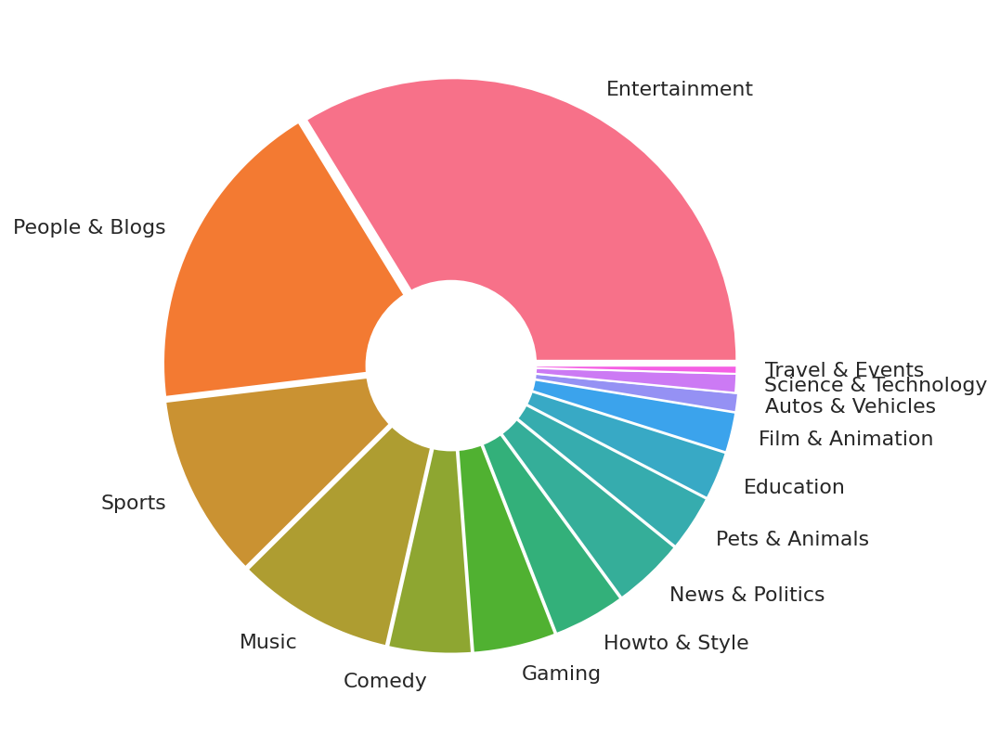

====================     Month:7     ============================================================


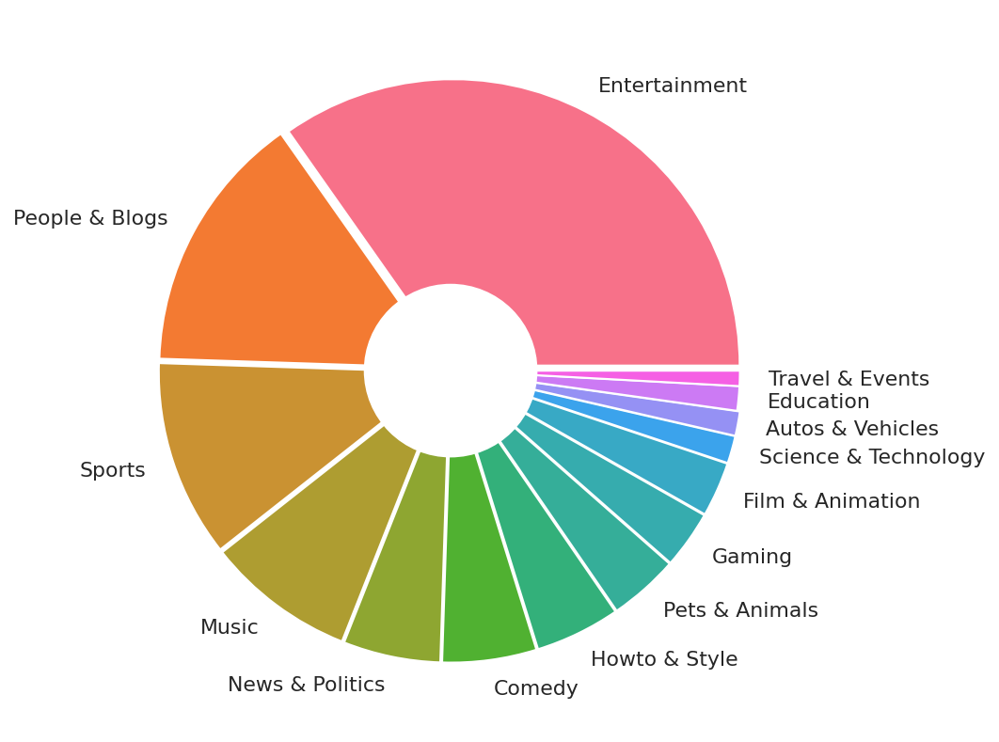

In [26]:
colors = sns.color_palette("husl", 15)
#colors = [ '#9D2417', '#AF41B4', '#003389' ,'#3C5F41',  '#967032', '#2734DE']
explode = (0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.01,0.01,0.01)
for i in range(5):
    print("=="*10 +" "*5 + f'Month:{i+3}' +" "*5 +"==="*20)
    plt.figure(figsize=(10,7))
    monthly.iloc[i].sort_values(ascending = False).plot.pie(colors =colors, explode = explode)
    plt.ylabel(" ")
    #draw circle
    centre_circle = plt.Circle((0,0),0.3,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.show()


* _(22.04.추가) 시각화 보완_ 

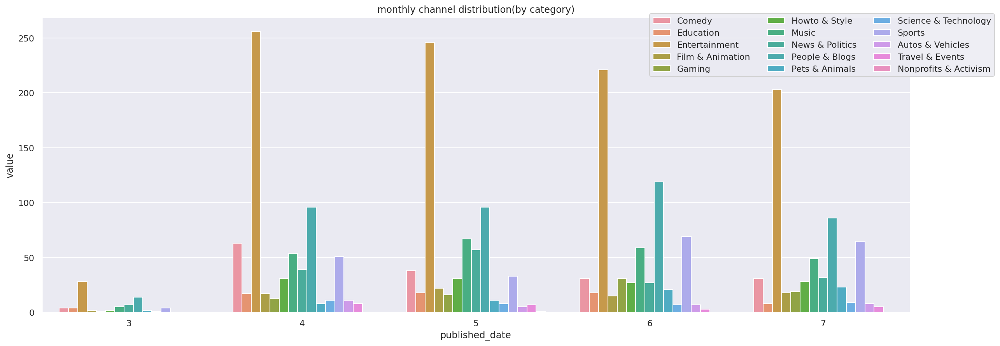

In [27]:
monthly_pivot_t = df.pivot_table(index = [df.index.month, 'category_name'],values = ['channel_id'], aggfunc = ['count'], fill_value= 0).T
melted_monthly = pd.melt(monthly_pivot_t)
plt.figure(figsize = (20,7))
sns.set_palette('Set3')
sns.barplot(data = melted_monthly, x = 'published_date', y= 'value', hue = 'category_name')
plt.title('monthly channel distribution(by category)')
plt.legend(loc = (0.7,0.8), fontsize = 11, frameon = True, ncol = 3)


#### 월별 카테고리별 채널별 비디오 개수 추이

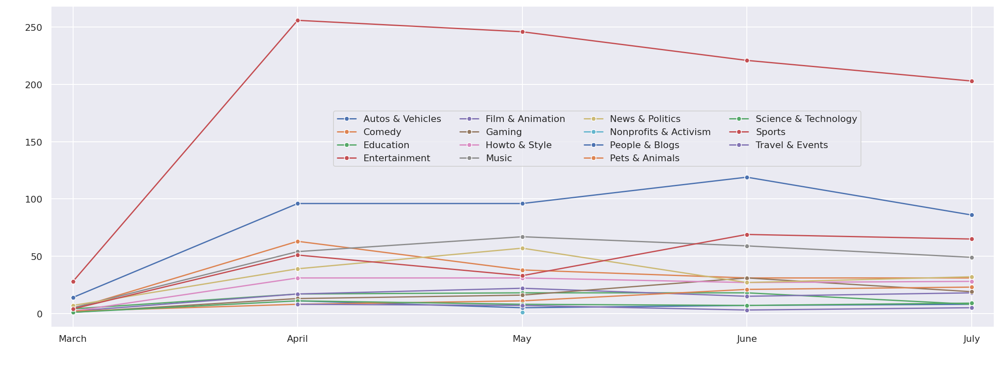

In [28]:
### 월별 카테고리별 채널별 비디오 개수(plot)
plt.figure(figsize = (20,7))
sns.set_theme(color_codes = True)

for i in range(15):
    sns.lineplot(data = monthly, x = monthly.index, y = monthly.columns[i], 
                 label = monthly.columns[i], marker = 'H' )
    #cmap = sns.color_palette("tab20c")
    
    plt.xlabel(" ", labelpad = 10)
    plt.ylabel(" ", labelpad = 10)
    plt.xlim([2.9,7.1])
    plt.legend(loc = (0.3,0.5), fontsize = 11, frameon = True, ncol = 4)
    plt.xticks(np.arange(3,8,1), ['March', 'April', 'May', 'June','July'])

plt.show()

#### 2-3. 월별 하위 10개(n_smallest10) 카테고리별 채널별 비디오
>
> - 상기 그래프(월별 전체 카테고리별 비디오 개수)는 비디오 개수가 적은 카테고리에 대해선 추이 파악이 어려움
> - 전체 카테고리 중 하위 10개의 카테고리(상위 5개 제외)에 대한 월별 비디오 개수 추이 살피기
> - 특징 
>   - news&politics 는 6월(올림픽, 유로2020 등) 스포츠 시즌에 따라 크게 감소한 것이 특징적임
>   - pets&animals 채널의 꾸준한 상승이 눈에 보임
>   - 또한 game 은 6월 일시적으로 급격한 증가를 보이며 tag 분석 결과 '프라이데이 나이트 펌킨' 에 대한 영상이 많이 포함됨  


In [29]:
## 6월 game 카테고리 tags
#df.tags[(df.index.month == 6) & (df.category_name == 'Gaming')].values

In [30]:
# 인기동영상의 카테고리 중 하위 10개에 대한 월별 비디오 개수 추이
low_top10 = df.groupby(['category_name'])['channel_id'].count().sort_values(ascending = False).nsmallest(10).index
#[i for i in low_top10]

In [31]:
'''
## 월별 카테고리별 하위 10개 채널별 비디오 개수(표)
for i in range(3,8):
    print("="*5 +" "*5+ f'{i}월' +" "*5 + "="*5)
    print(monthly.loc[i].sort_values(ascending = True).nsmallest(10))
    print("======"*30)
'''

'\n## 월별 카테고리별 하위 10개 채널별 비디오 개수(표)\nfor i in range(3,8):\n    print("="*5 +" "*5+ f\'{i}월\' +" "*5 + "="*5)\n    print(monthly.loc[i].sort_values(ascending = True).nsmallest(10))\n    print("======"*30)\n'

#### 하위 10개 카테고리별 채널별 비디오 개수 추이

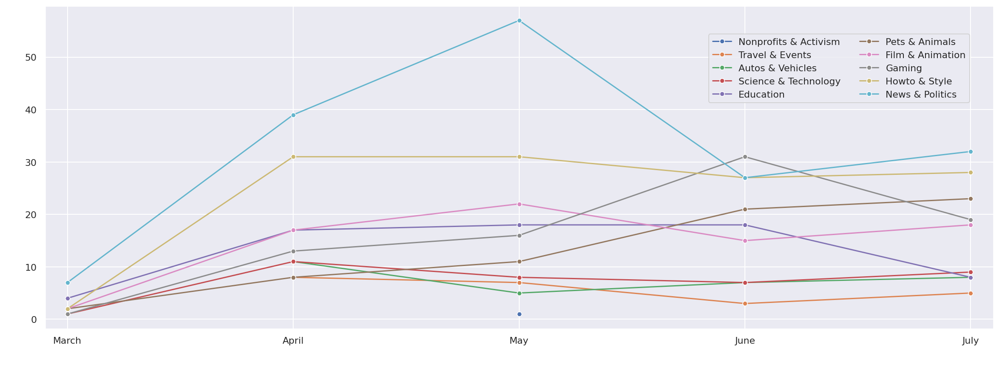

In [32]:
## lowest_10 category에 대한 추이(월별)
plt.figure(figsize = (20,7))
for i in low_top10:
    sns.lineplot(data = monthly, x = monthly.index, y = monthly[i],
                 label = i, marker = 'H' )
    #cmap = sns.color_palette("tab20c")

    plt.xlabel(" ", labelpad = 10)
    plt.ylabel(" ", labelpad = 10)
    plt.xlim([2.9,7.1])
    plt.legend(loc = (0.7,0.7), fontsize = 11, frameon = True, ncol = 2)
    plt.xticks(np.arange(3,8,1), ['March', 'April', 'May', 'June','July'])

plt.show()

#### 2-4. 월별 (전체) 카테고리별 비디오 분포(추이-비율)    
- 3월 데이터의 절대량 부족으로 전체 추이를 살피고자 비율로 변경하여 계산
   - 위에서 분석한 내용 외 큰 추이의 변동은 없음

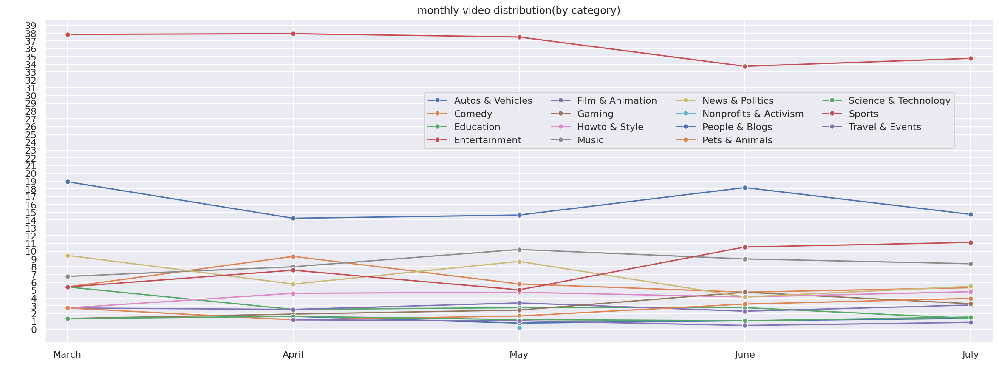

In [33]:
### 월별 카테고리별 분포(3월의 전체 데이터 양이 적으므로 비율로 계산)
month= df.pivot_table(index = [df.index.month, 'category_name'],values = ['channel_id'],
                      aggfunc = lambda x: x.count(), fill_value= 0)
stacked = month.unstack()
ratio_month = stacked.div(stacked.sum(axis=1), axis= 0).multiply(100)

plt.figure(figsize = (20,7))
for i in range(15):
    sns.lineplot(data = ratio_month, x = ratio_month.index, y = ratio_month.columns[i], 
                 label = ratio_month.columns[i][1], marker = 'o')
    plt.xlabel(" ", labelpad = 10)
    plt.ylabel(" ", labelpad = 10)
    plt.xlim([2.9,7.1])
    plt.xticks(np.arange(3,8,1), ['March', 'April', 'May', 'June','July'])
    plt.yticks(np.arange(0,40,1.) )
    plt.legend(loc = (0.4,0.6), fontsize = 11, frameon = True, ncol = 4)
    plt.title('monthly video distribution(by category)')
plt.show()

### 3. 주별 카테고리별 채널

#### 3-1. 주별 카테고리별 채널
>    - 분석 방법: datetime.week를 기준으로 주별 분류 후, 카테고리별 채널의 개수 분석
>   - datetime.week는 isocalendar를 기준으로 분류된 것임


In [34]:
## 주별 카테고리별 채널 수
## 주간 카테고리별 채널 수 - isocalndar 기준(월-일) 
weekly_pivot = df.pivot_table(index = [df.index.week, 'category_name'],values = ['channel_id'], aggfunc = ['count'], fill_value = 0)
weekly = weekly_pivot.unstack()
weekly.columns = [weekly.columns[i][2] for i in range(df.category_name.nunique())]

In [35]:
'''
## 주별 카테고리별 채널별 비디오 개수(표)
for i in range(12,31):
    print("="*5 + f'{i}주차'+ "="*5)
    print(weekly.loc[i].sort_values(ascending = False))
    print("======"*30)
'''

'\n## 주별 카테고리별 채널별 비디오 개수(표)\nfor i in range(12,31):\n    print("="*5 + f\'{i}주차\'+ "="*5)\n    print(weekly.loc[i].sort_values(ascending = False))\n    print("======"*30)\n'

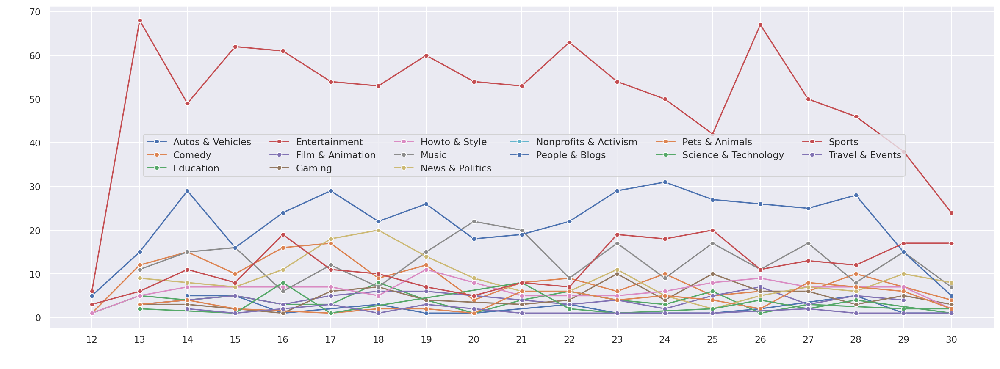

In [36]:
plt.figure(figsize = (20,7))
#ax = fig.add_subplot()
#fig.subplots_adjust(top =0.9)

sns.set_theme(color_codes = True)
#fig.suptitle('weekly trend by catogory',fontsize=15, fontweight='bold')
for i in range(15):
    sns.lineplot(data = weekly, x = weekly.index, y = weekly.columns[i], 
                 label = weekly.columns[i], marker = 'H' )
    #cmap = sns.color_palette("tab20c")
    
    plt.xlabel(" ", labelpad = 10)
    plt.ylabel(" ", labelpad = 15)
    #plt.xlim([2.9,7.1])
    plt.legend(loc = (0.1,0.47), fontsize = 11, frameon = True, ncol = 6)
    plt.xticks(np.arange(12,31))

plt.show()

* _(22.04.추가) 시각화 보완_ 

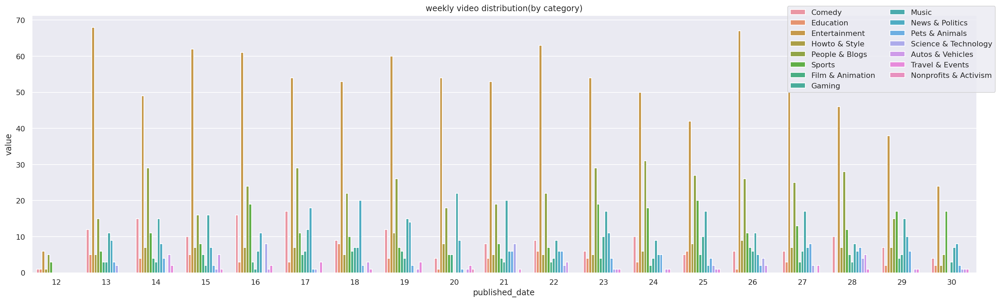

In [37]:
weekly_pivot_t = df.pivot_table(index = [df.index.week, 'category_name'],values = ['channel_id'], aggfunc = ['count'], fill_value= 0).T
melted_weekly = pd.melt(weekly_pivot_t)
plt.figure(figsize = (25,7))
sns.set_palette('Set3')
sns.barplot(data = melted_weekly, x = 'published_date', y= 'value', hue = 'category_name')
plt.title('weekly video distribution(by category)')
plt.legend(loc = (0.8,0.7), fontsize = 11, frameon = True, ncol = 2)


#### 3-2. 주별 상위 10개(n_largest10) 카테고리별 채널별 비디오
- 주차별 카테고리에 따른 변동폭이 큰 부분은 시기적인 이슈등이 영향을 끼친것으로 판단됨        
- 하지만 전체적인 비중은 크게 변동되는 부분이 없음

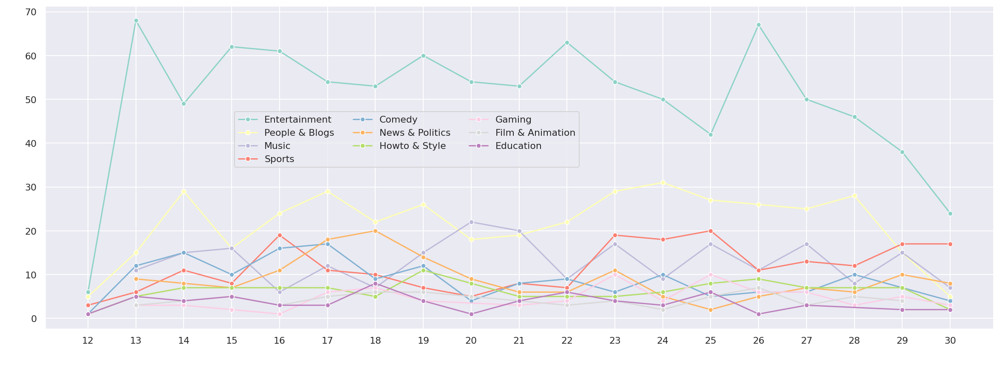

In [38]:
# 인기동영상의 카테고리 중 상위 10개에 대한 주별 비디오 개수 추이
cat_top10 = df.groupby(['category_name'])['channel_id'].count().sort_values(ascending = False).nlargest(10).index
#[i for i in cat_top10]

## top10 category에 대한 추이(주별)
plt.figure(figsize = (20,7))
for i in cat_top10:
    sns.lineplot(data = weekly, x = weekly.index, y = weekly[i],
                 label = i, marker = 'H' )
    #cmap = sns.color_palette("tab20c")
    
    plt.xlabel(" ", labelpad = 10)
    plt.ylabel(" ", labelpad = 10)
    #plt.xlim([2.9,7.1])
    plt.legend(loc = (0.2,0.5), fontsize = 11, frameon = True, ncol = 3)
    plt.xticks(np.arange(12,31))

plt.show()

#### 3-3. 주별(전체) 카테고리별 비디오 분포(추이-비율)

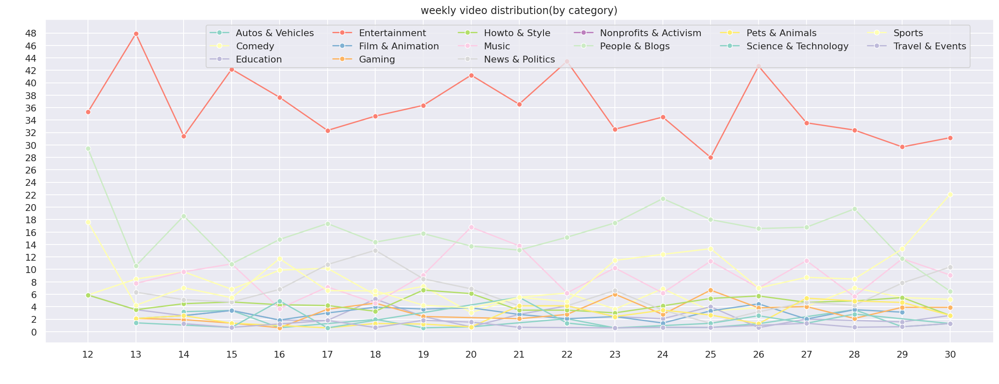

In [39]:
### 주별 카테고리별 분포(3월의 전체 데이터 양이 적으므로 비율로 계산)
week= df.pivot_table(index = [df.index.week, 'category_name'],values = ['channel_id'],
                      aggfunc = lambda x: x.count(), fill_value= 0)
stacked = week.unstack()
ratio_week = stacked.div(stacked.sum(axis=1), axis= 0).multiply(100)

plt.figure(figsize = (20,7))
for i in range(15):
    sns.lineplot(data = ratio_week, x = ratio_week.index, y = ratio_week.columns[i], 
                 label = ratio_week.columns[i][1], marker = 'o')
    plt.xlabel(" ", labelpad = 10)
    plt.ylabel(" ", labelpad = 10)
    #plt.xlim([2.9,7.1])
    plt.xticks(np.arange(12,31))
    plt.yticks(np.arange(0,50,2.) )
    plt.legend(loc = (0.17,0.85), fontsize = 11, frameon = True, ncol = 6)
    plt.title('weekly video distribution(by category)')
plt.show()

### 4. 월별/주별 TOP 채널

#### 4-1. 월별 TOP 10 채널(비디오 개수 기준)
- 월별 카테고리별 채널의 개수 분석에서 나타난 결과와 비슷함
- 인기동영상 카테고리에서 큰 비중을 차지하는 entertainment, music 채널은 꾸준하게 TOP10 채널에 링크됨
- 특징
 - people$blogs 채널은 TOP10채널에 주로 포함되는 편이나, 시즌에 따른 sports 채널의 급격한 증가로 6월 이후로는 수가 줄어듬
 - 7월:  pet & animals, film & animation 의 채널이 TOP10에 올라간 경우로 특직정임

In [40]:
### 월별 카테고리별 top10 구하기 
month_ch = df.pivot_table(index = [df.index.month, 'channel_id'],values = ['video_id'], aggfunc = ['count'], fill_value= 0).unstack()

In [41]:
def top10_dict(df):
    # dictionary로 월별 top10 channel 정리
    top10_dict = {}
    top10_video_num = {}
    # 3월-7월까지 num of video counting - nlargest(10)  
    for i in range(3,8):
        top10_dict[f'{i}'] = []
        top10s = df.loc[i].nlargest(10).index
        top10_video_num[f'{i}'] = df.loc[i].nlargest(10).values
        for j in range(10):
            top10_dict[f'{i}'].append(top10s[j][2])
    return top10_dict, top10_video_num

month_top10, month_top10_num = top10_dict(month_ch)

## 월별 top10 channel_Id
#month_top10
## 월별 top10 channel의 인기동영상 업로드 비디오 개수
#month_top10_num

In [42]:
#month_top10_num['3']

In [43]:
#month_top10['3']

In [44]:
### 월별 top10 채널들의 카테고리 추출
month_top10_cat = {}
for i in range(3,8):
    month_top10_cat[f'{i}'] = []
    for j in range(len(month_top10[f'{i}'])):
        month_top10_cat[f'{i}'].append(df.category_name[df.channel_id == month_top10[f'{i}'][j]][0])
#month_top10_cat['3']

In [45]:
#### top10_ (channel_id, cat) 재정리
month_top10_n={}
for i in range(3,8):
    month_top10_n[f'{i}'] = []
    for ch, cat in zip(month_top10[f'{i}'], month_top10_cat[f'{i}']):
        month_top10_n[f'{i}'].append((ch,cat))
#month_top10_n

#### 월별 TOP 10 채널(시각화)

====================          month:3          ============================================================


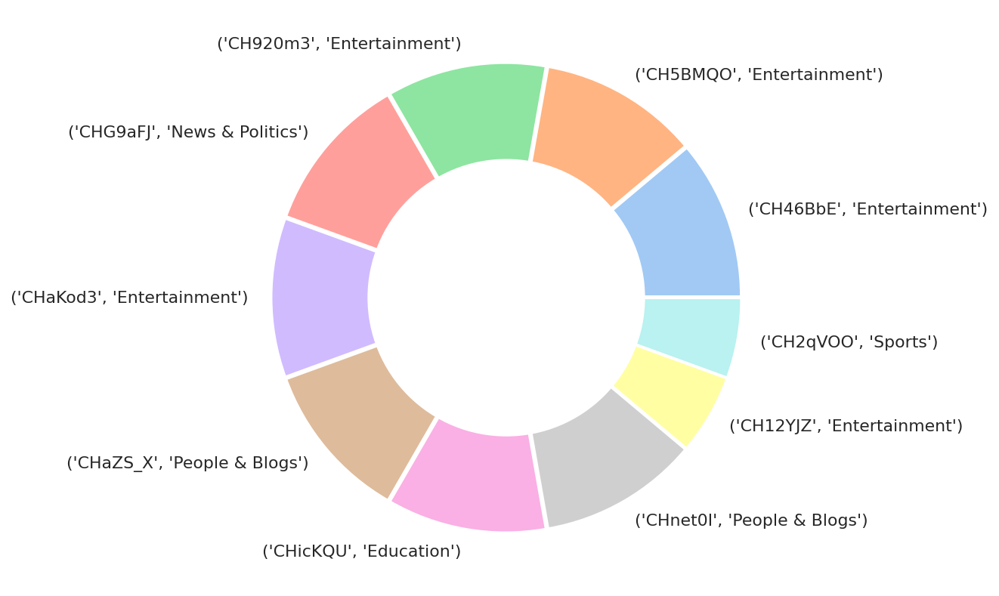

====================          month:4          ============================================================


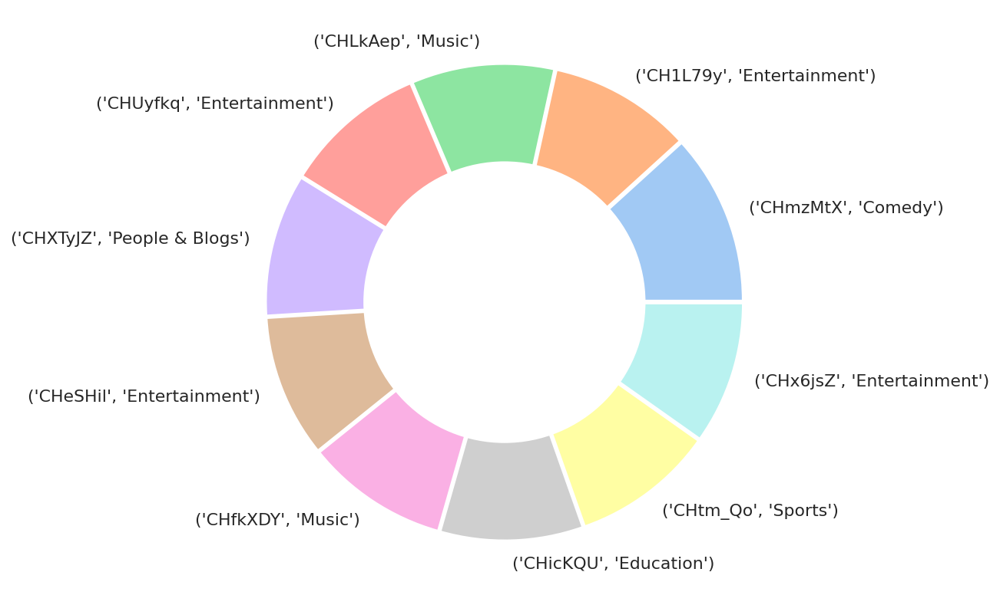

====================          month:5          ============================================================


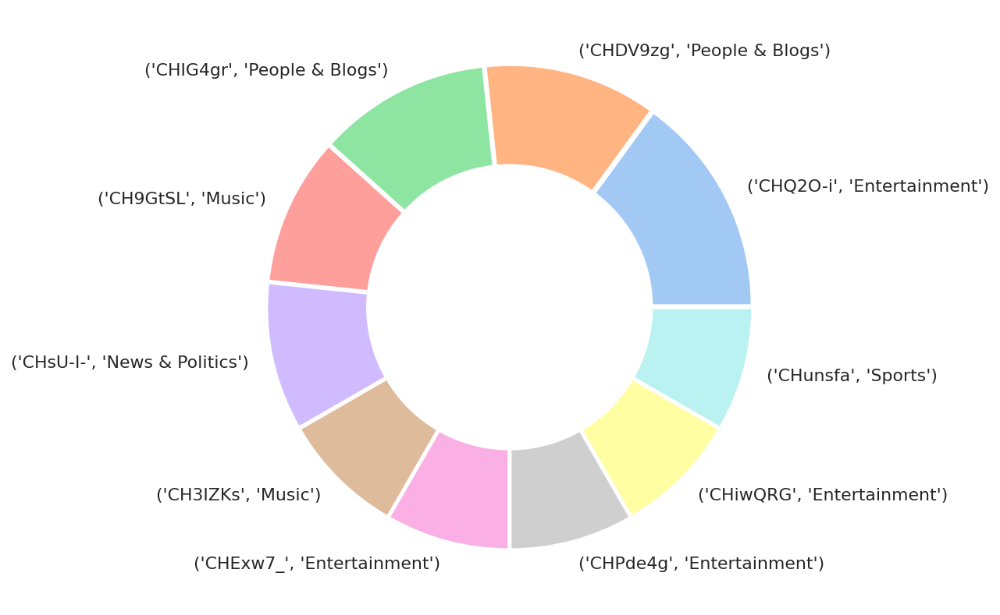

====================          month:6          ============================================================


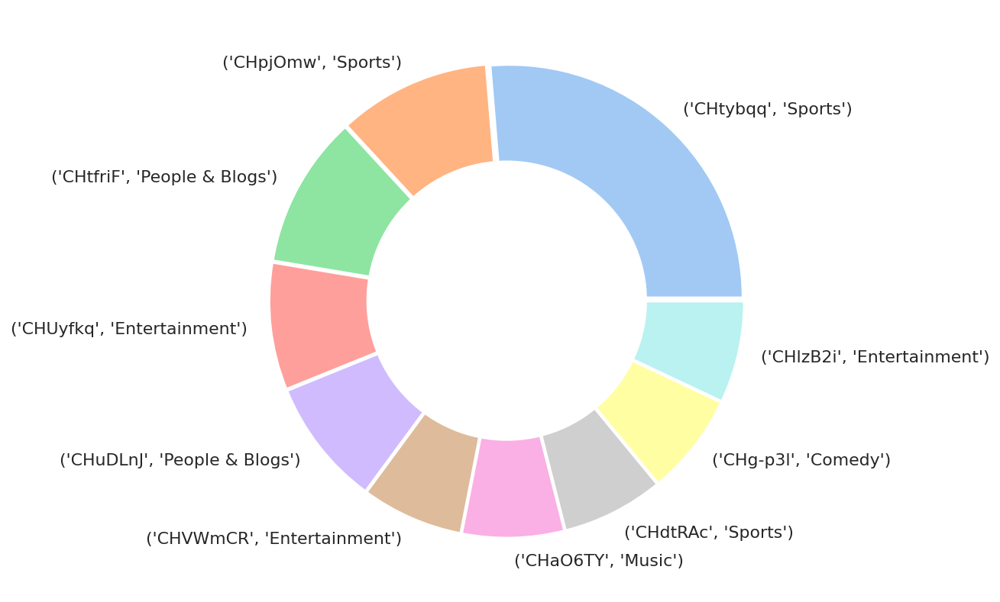

====================          month:7          ============================================================


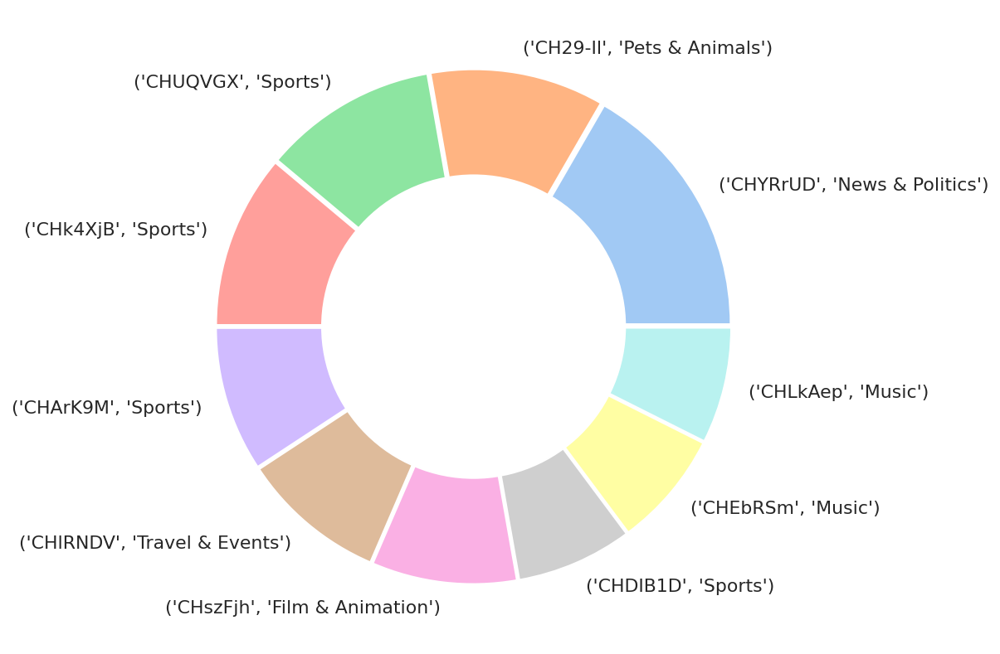

In [46]:
#colors = sns.color_palette("husl", 15)
colors = [ '#9D2417', '#AF41B4', '#003389' ,'#3C5F41',  '#967032', '#2734DE']
explode = (0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02)
for i in range(3,8):
    #for ch, cat, num in zip(month_top10[f'{i}'], month_top10_cat[f'{i}'], month_top10_num[f'{i}']):
    print("=="*10 +" "*10 + f'month:{i}'+" "*10 + "==="*20)
    colors = sns.color_palette('pastel')
    plt.figure(figsize=(10,7))
    plt.pie(month_top10_num[f'{i}'], labels =month_top10_n[f'{i}'], explode = explode, colors = colors)
    #draw circle
    centre_circle = plt.Circle((0,0),0.6,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.show()


* _(22.04.추가) 시각화 보완_ 
    - channel - category 매핑하여 시각화 보완 필요

<Figure size 1440x504 with 0 Axes>

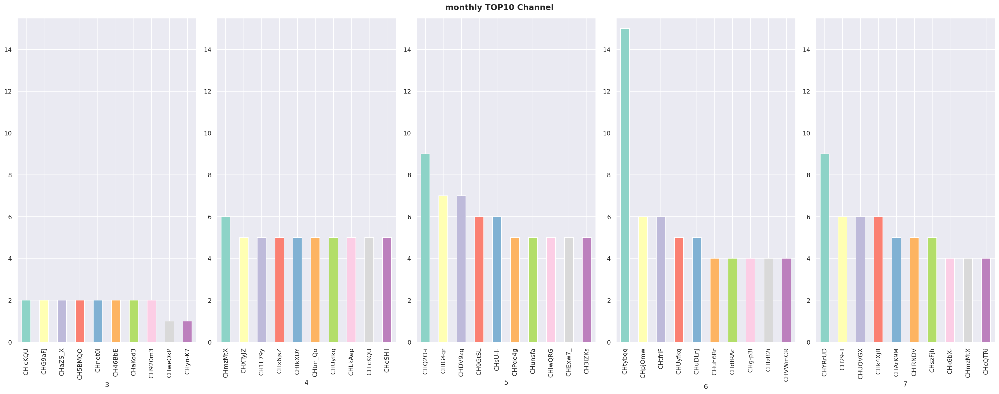

In [47]:
month_ch = df.pivot_table(index = [df.index.month, 'channel_id'],values = ['video_id'], aggfunc = ['count'], fill_value= 0).T
a = pd.melt(month_ch)
df.groupby([df.index.month, 'channel_id'])['video_id']

plt.figure(figsize = (20,7))
sns.set_palette('Set3')

fig, axes = plt.subplots(1,5, figsize = (25,10))
ax = axes.flatten()
colors = sns.color_palette('Set3')
for i in range(5):
    df[df.index.month == i+3]['channel_id'].value_counts(ascending = False).head(10).plot(kind = 'bar', ax = ax[i], color = colors)
    ax[i].set_xlabel
    ax[i].set_ylim(0,15.5)
    ax[i].set_xlabel(f'{i+3}')

    plt.suptitle('monthly TOP10 Channel',fontweight ="bold")
    plt.tight_layout()

plt.show();
    

#### 월별 TOP10 채널에 한 번 이상 올라간 영상은?
>    - 인기동영상에 한 번 이상 올라간 영상이 대다수( 같은 채널에서 인기동영상에 오르는 경우 많음)
>    - 월별 TOP10 채널 중, 한 번 이상 월간 TOP10에 드는 채널 찾아보기
>>      ['CHicKQU', 'CHLkAep', 'CHUyfkq']

> - 채널명   
 - 올리버썜의 영어회화(education) 
 - 문명특급(entertainment) 
 -방탄소년단(music)


In [48]:
### top10 올라간 채널 모으고, 채널-카테고리 연결
## top10 채널 하나의 리스트로 정리
month_tops = []
for i in range(3,8):
    month_tops.extend(month_top10[f'{i}'])
#month_tops

In [49]:
## 월별 top10 인기 동영상에 한 번 이상 올라간 영상 채널 구하기
from collections import Counter
count_top =Counter(month_tops)

##### dict 에서 max_value 추출 방법 
## 1. max(count_top, key = count_top.get)
trending_chs = [k for k, v in count_top.items() if max(count_top.values()) == v]
trending_chs  # 올리버/문명특급/방탄소년단

['CHicKQU', 'CHLkAep', 'CHUyfkq']

In [50]:
for ch in trending_chs:
    print(pd.DataFrame(df[df.channel_id == ch]))

               video_id channel_id   category_name  duration tags  \
published_date                                                      
2021-03-26        VW9AV    CHicKQU       Education  PT12M58S  NaN   
2021-03-30        V2IRJ    CHicKQU       Education   PT12M2S  NaN   
2021-04-02        V-U9f    CHicKQU       Education  PT11M42S  NaN   
2021-04-09        V9rrA    CHicKQU       Education  PT12M34S  NaN   
2021-04-14        VPRHZ    CHicKQU       Education  PT11M49S  NaN   
2021-04-23        VqtBF    CHicKQU       Education  PT11M38S  NaN   
2021-04-30        VFm75    CHicKQU       Education  PT12M47S  NaN   
2021-05-04        VZPtJ    CHicKQU       Education  PT12M20S  NaN   
2021-05-05        VZBdM    CHicKQU       Education    PT4M9S  NaN   
2021-05-26        VSgn-    CHicKQU       Education   PT12M4S  NaN   
2021-07-16        VXvpL    CHicKQU  People & Blogs  PT16M18S  NaN   

                                                      description  \
published_date                   

#### 4-2. 주별 TOP 5 채널(비디오 개수 기준)
 
- 월별 TOP10 채널의 개수 분석에서 나타난 결과와 비슷하게 entertainment, music 채널은 주별 TOP5 채널에 링크되는 경우가 많은
- 특징
 - people$blogs 채널은 주별 TOP5채널에 주로 포함되는 편이며, 전체 카체고리에서 비중이 적은편에 속했던 howto & style 채널이 주별 TOP5채널에 드는 경우가 많이 보임
 - 이를 통해 사람들은 나와 비슷한 사람들의 일상과 일상 유지에 필요한 요리, 살림 방법 등에도 많은 관심을 가진다는 것을 알 수 있음
 - 전체적인 조회수 측면에서는 높지 않을 수 있지만, 주별 TOP5 채널은 삶과 연결된 컨텐츠가 사람들의 이목을 끌고 있음을 나타낸다고 할 수 있음

In [51]:
# 주별 top5
week_ch = df.pivot_table(index = [df.index.week, 'channel_id'],values = ['video_id'], 
                               aggfunc = ['count'], fill_value= 0).unstack()
#week_ch.iloc[0].nlargest(5) 

In [52]:
def top5_dict(df):
    # dictionary로 주별 top5 channel 정리
    top5_dict = {}
    top5_video_num = {}
    # 12주차-30주차까지 num of video counting - nlargest(5)  
    for i in range(12,31):
        top5_dict[f'{i}'] = []
        top5s = df.loc[i].nlargest(5).index
        top5_video_num[f'{i}'] = df.loc[i].nlargest(5).values
        for j in range(5):
            top5_dict[f'{i}'].append(top5s[j][2])
    return top5_dict, top5_video_num
week_top5, week_top5_num = top5_dict(week_ch)

## 주별 top5 channel_id
#week_top5
## 주별 top5 channel의 인기동영상 업로드 비디오 개수
#week_top5_num

In [53]:
### top5 올라간 채널 모으고, 채널-카테고리 연결
## top10 채널 하나의 리스트로 정리
week_tops = []
for i in range(12,31):
    week_tops.extend(week_top5[f'{i}'])
#week_tops

In [54]:
### 주별 top5 채널들의 카테고리 추출
week_top5_cat = {}
for i in range(12,31):
    week_top5_cat[f'{i}'] = []
    for j in range(len(week_top5[f'{i}'])):
        week_top5_cat[f'{i}'].append(df.category_name[df.channel_id == week_top5[f'{i}'][j]][0])
#week_top5_cat['13']

In [55]:
#### top5_ (channel_id, cat) 재정리
week_top5_n={}
for i in range(12,31):
    week_top5_n[f'{i}'] = []
    for ch, cat in zip(week_top5[f'{i}'], week_top5_cat[f'{i}']):
        week_top5_n[f'{i}'].append((ch,cat))
#week_top5_n

#### 주별 TOP5 채널(시각화)

====================          week:12          ============================================================


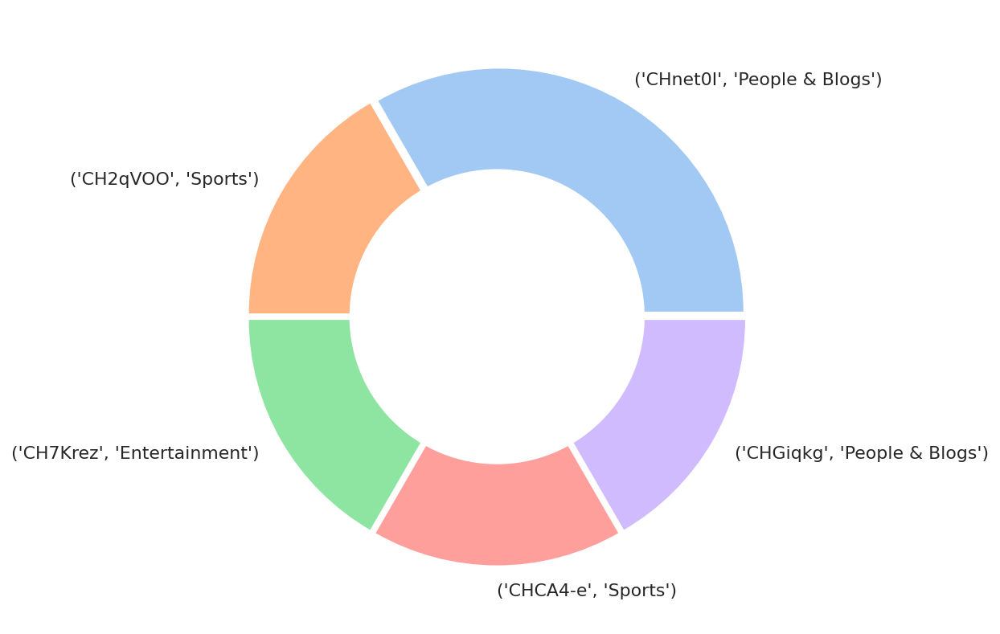

====================          week:13          ============================================================


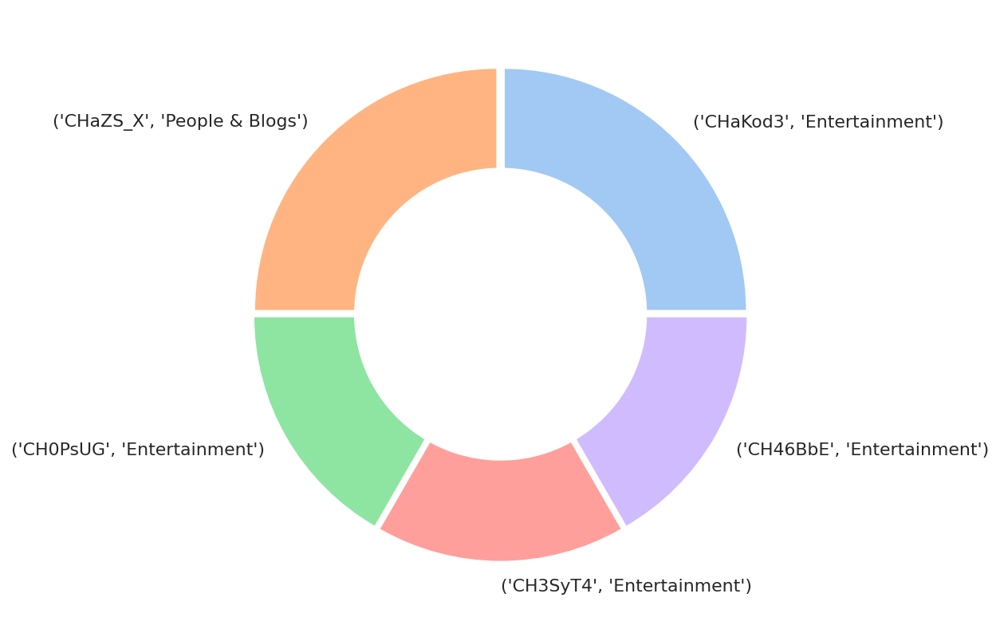

====================          week:14          ============================================================


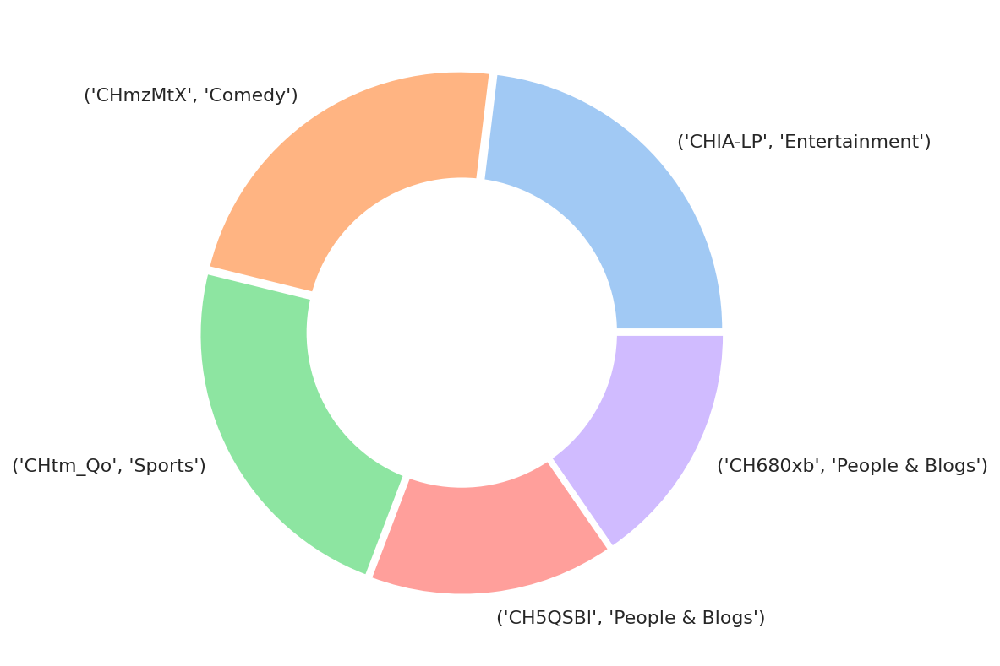

====================          week:15          ============================================================


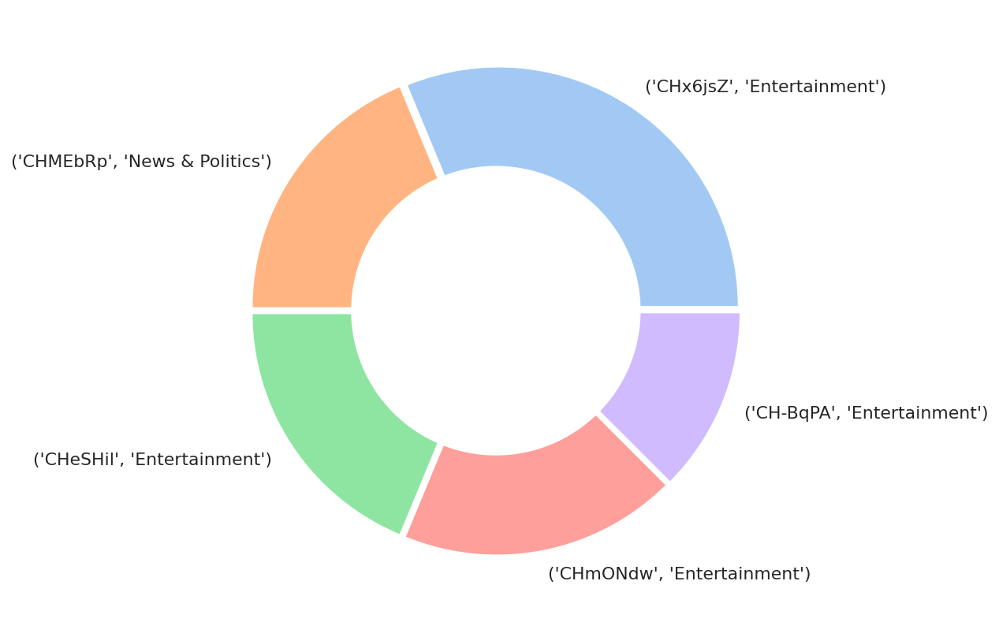

====================          week:16          ============================================================


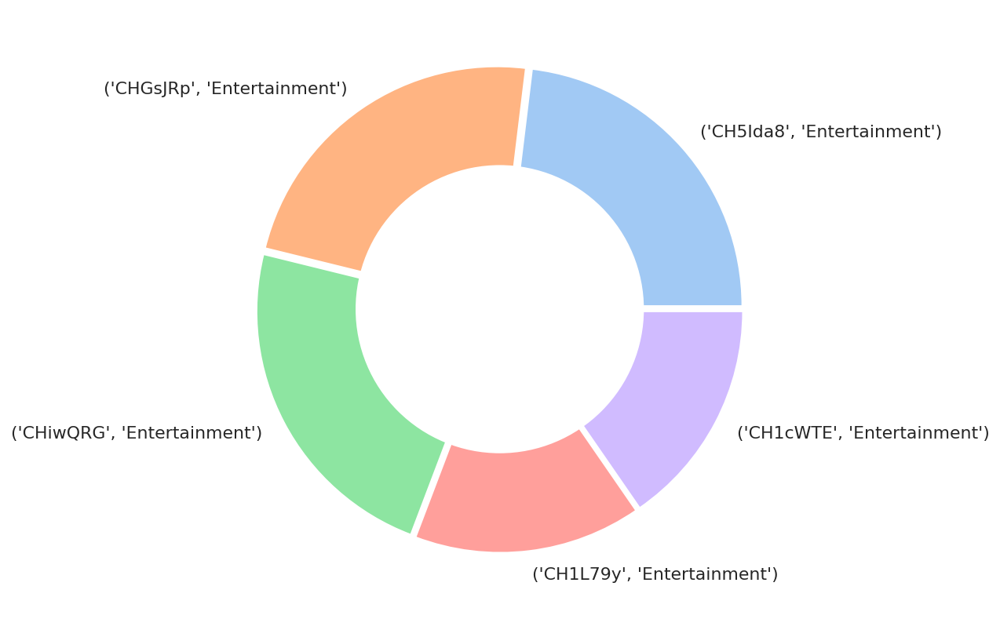

====================          week:17          ============================================================


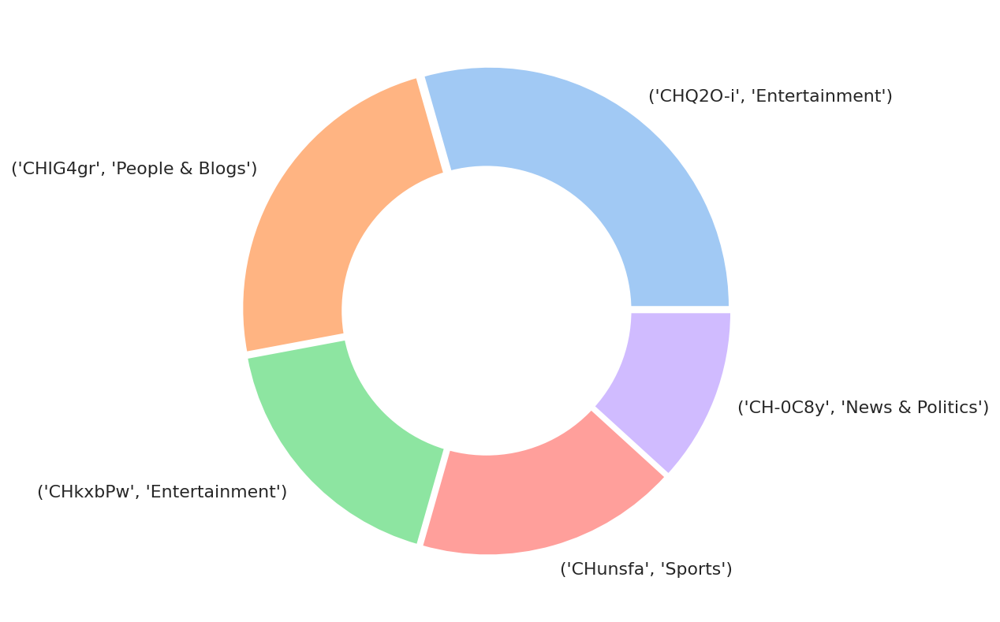

====================          week:18          ============================================================


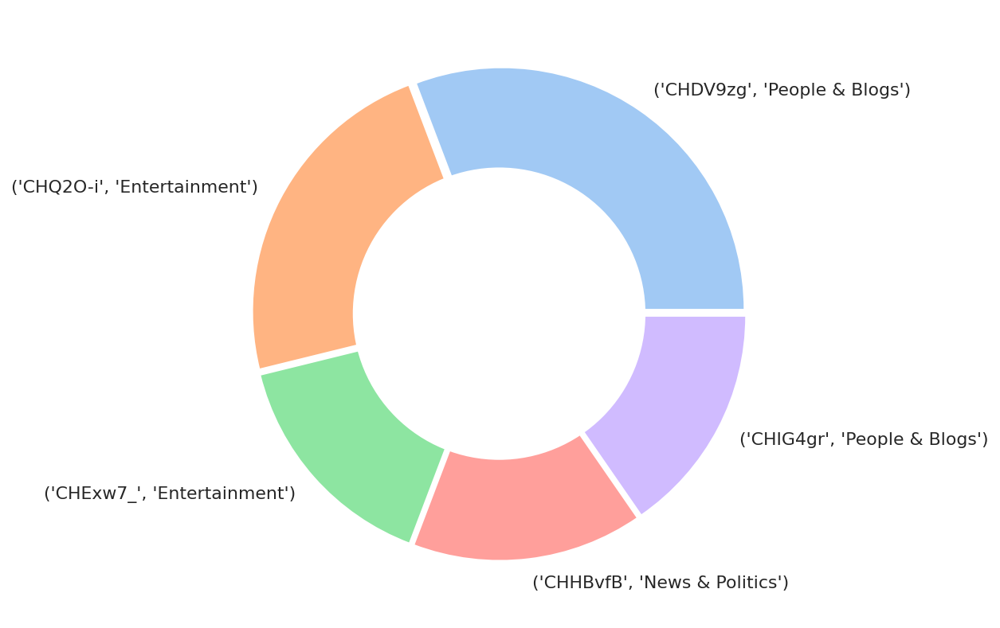

====================          week:19          ============================================================


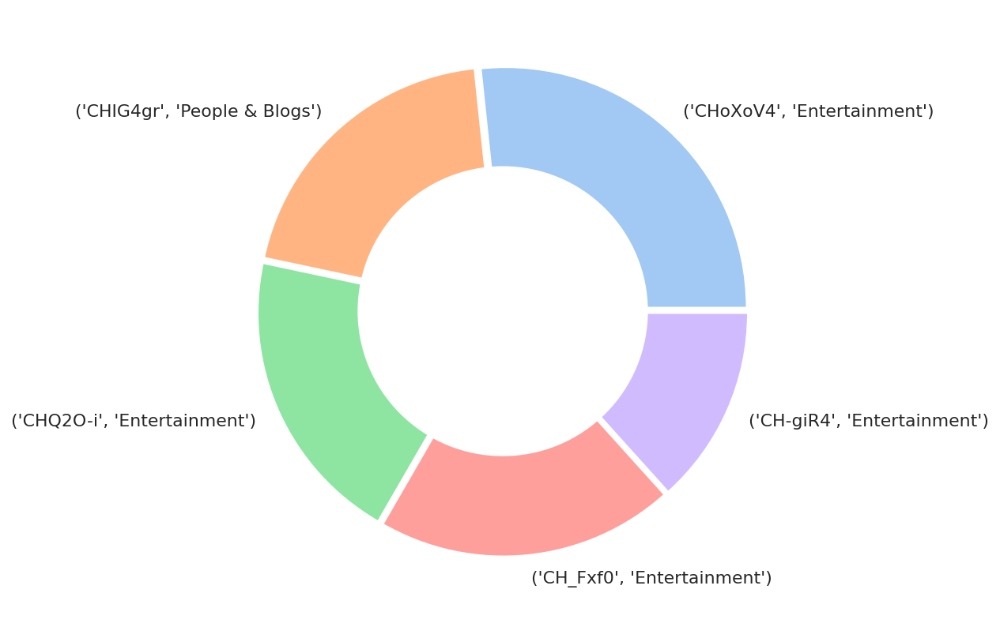

====================          week:20          ============================================================


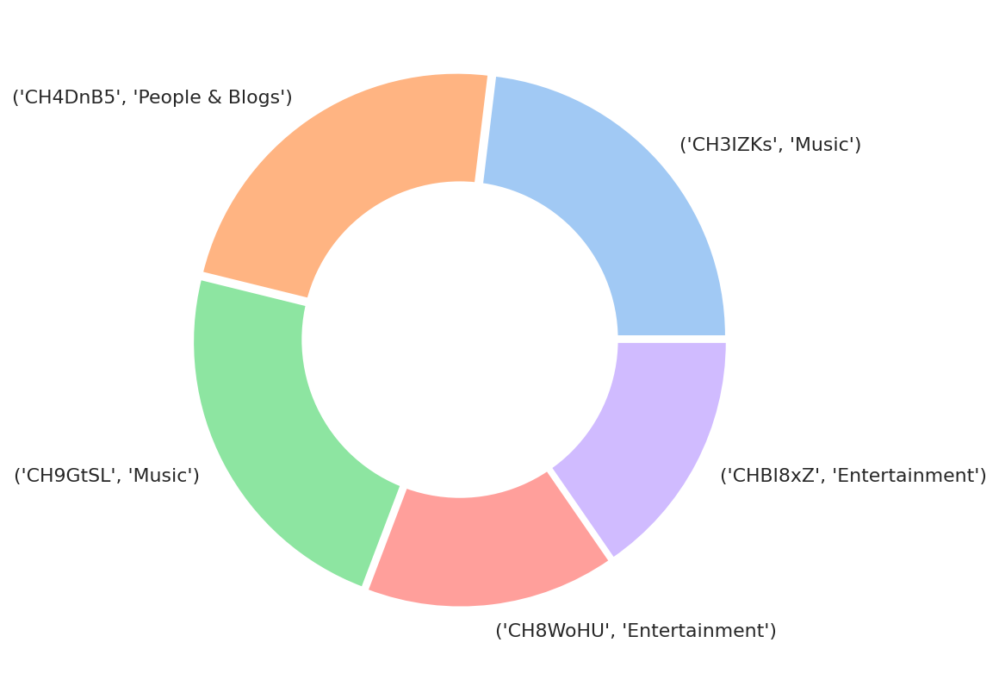

====================          week:21          ============================================================


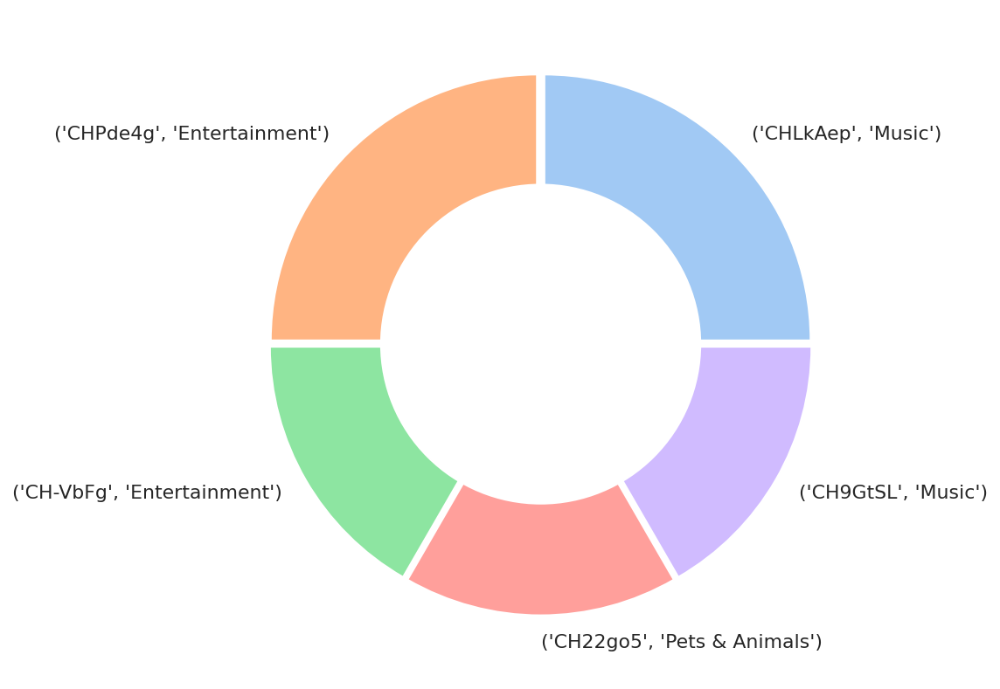

====================          week:22          ============================================================


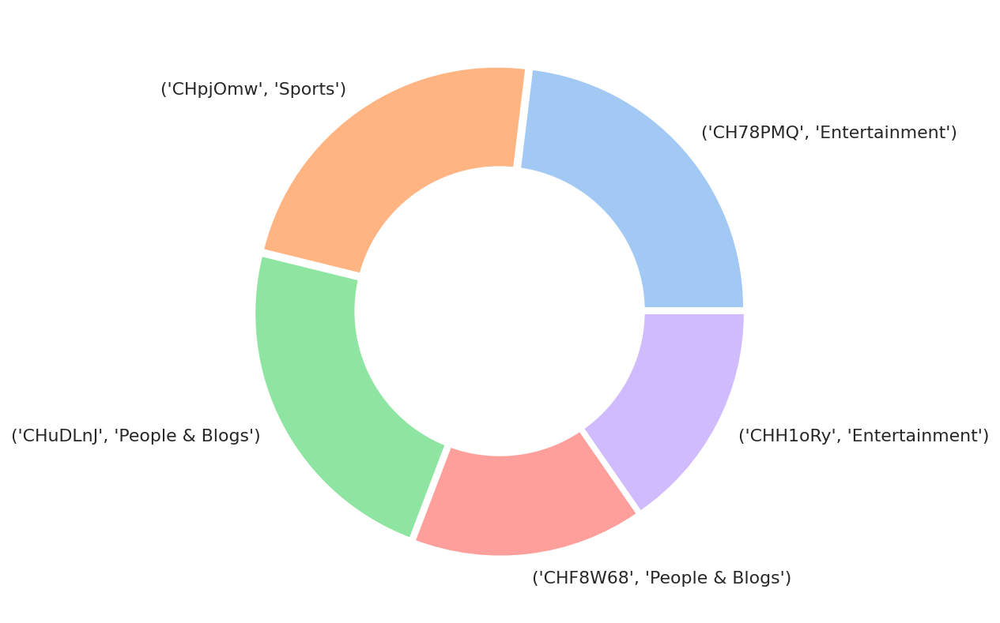

====================          week:23          ============================================================


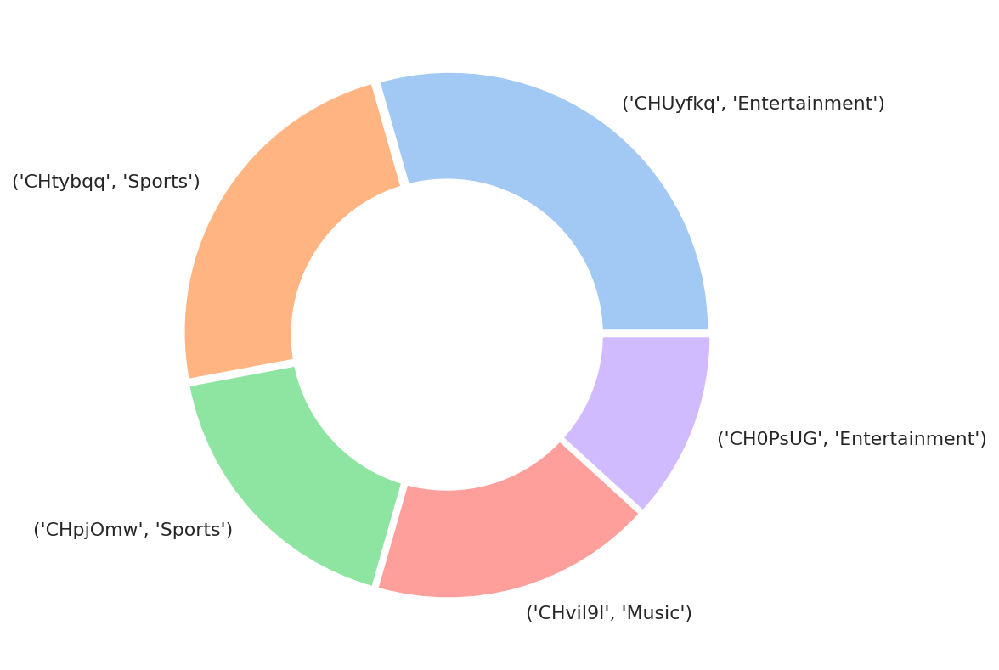

====================          week:24          ============================================================


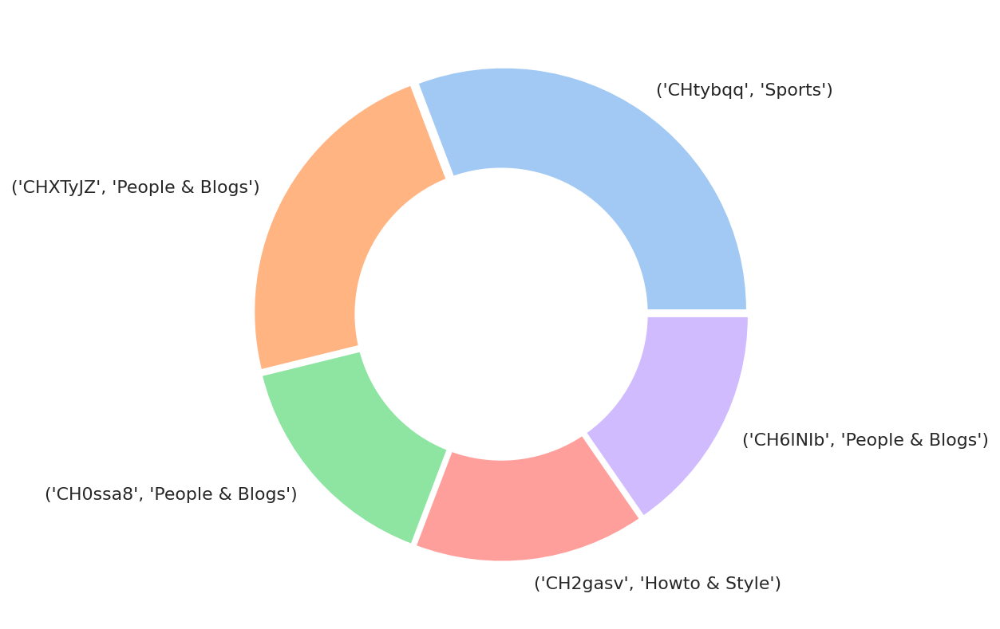

====================          week:25          ============================================================


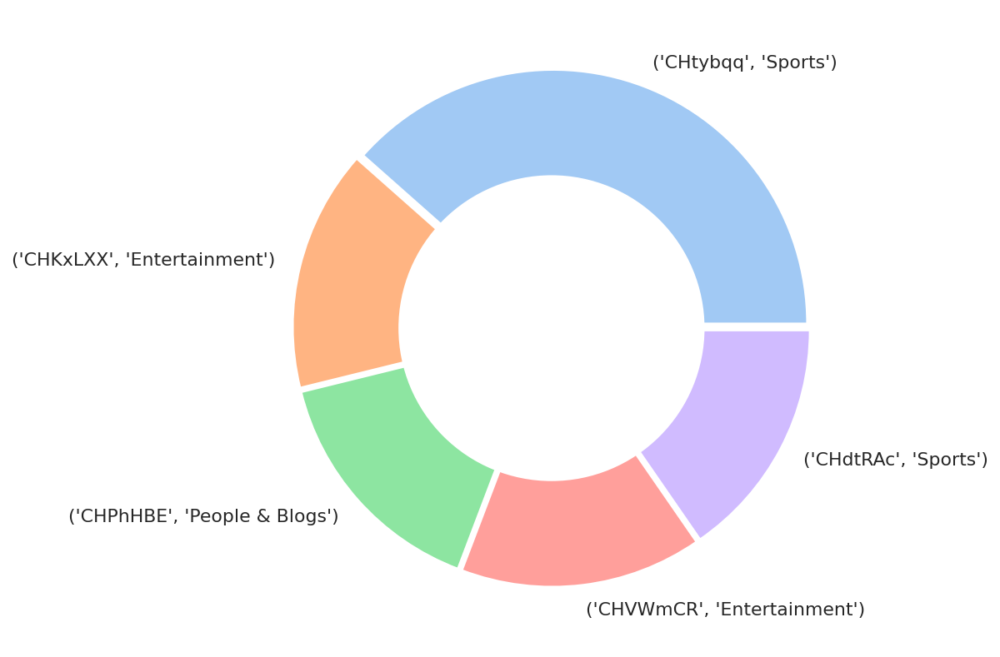

====================          week:26          ============================================================


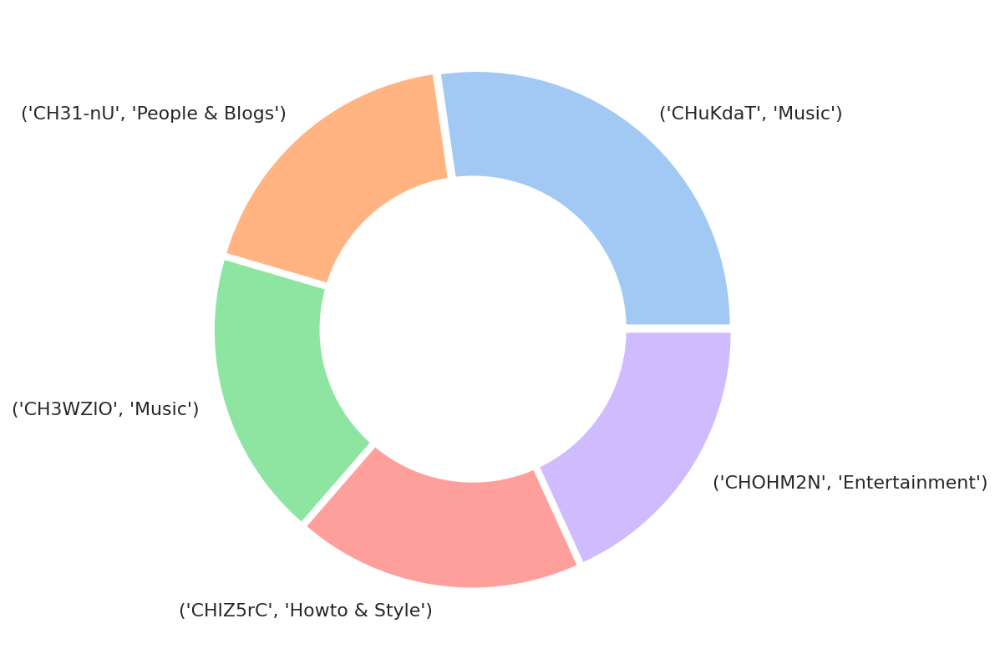

====================          week:27          ============================================================


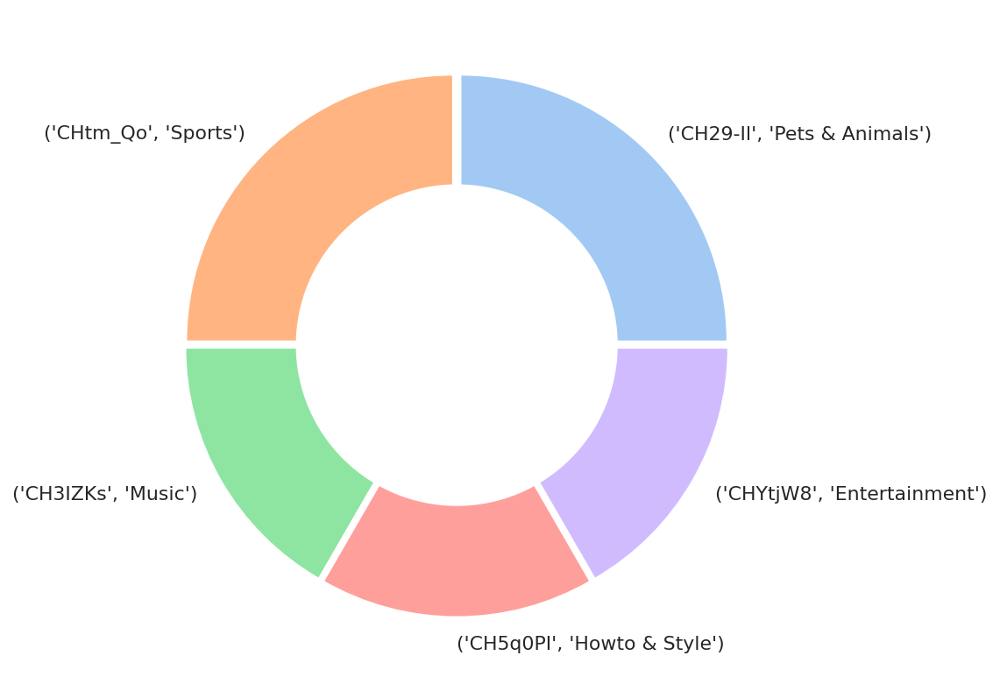

====================          week:28          ============================================================


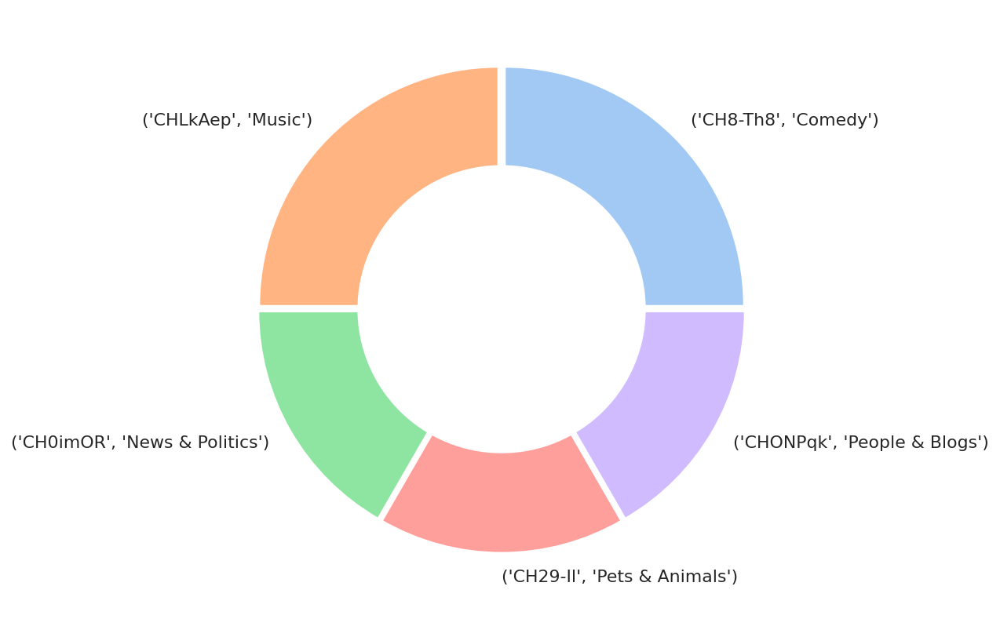

====================          week:29          ============================================================


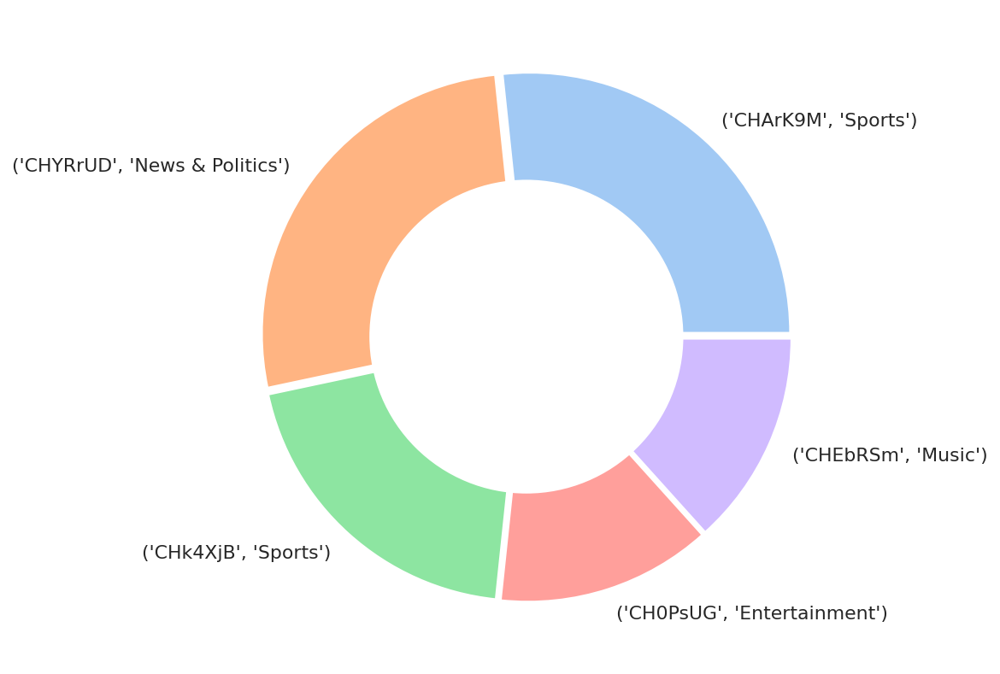

====================          week:30          ============================================================


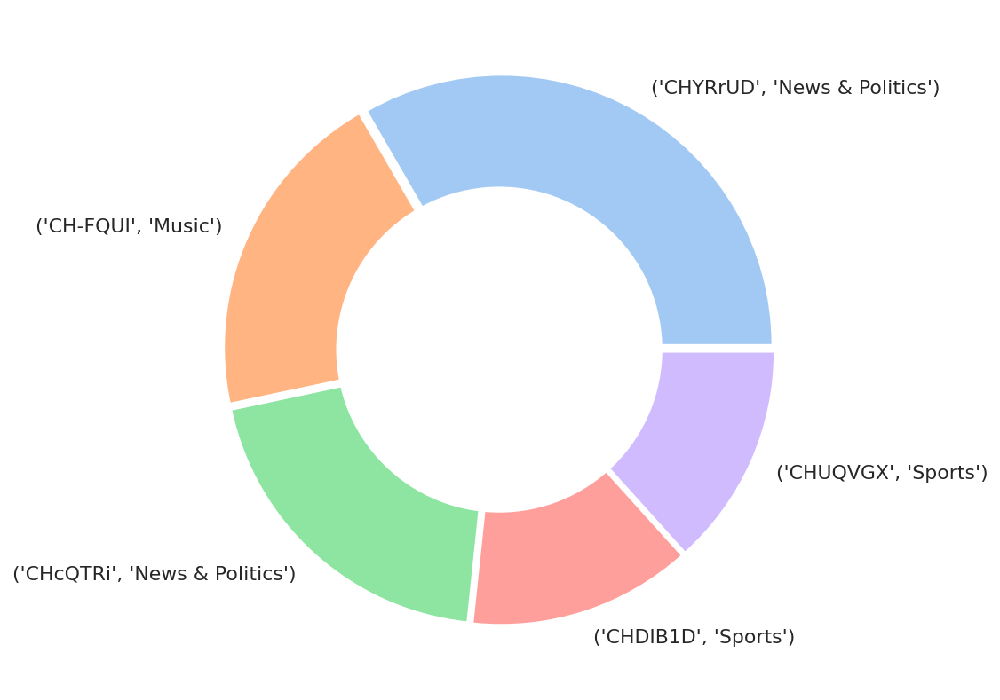

In [56]:
#colors = sns.color_palette("husl", 15)
colors = [ '#9D2417', '#AF41B4', '#003389' ,'#3C5F41',  '#967032', '#2734DE']
explode = (0.02,0.02,0.02,0.02,0.02)
for i in range(12,31):
    #for ch, cat, num in zip(week_top5[f'{i}'], week_top5_cat[f'{i}'], week_top5_num[f'{i}']):
    print("=="*10 +" "* 10 + f'week:{i}'+" "*10 + "==="*20)
    colors = sns.color_palette('pastel')
    plt.figure(figsize=(10,7))
    plt.pie(week_top5_num[f'{i}'], labels =week_top5_n[f'{i}'], explode = explode, colors = colors)
    #draw circle
    centre_circle = plt.Circle((0,0),0.6,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.show()


* _(22.04.추가) 시각화 보완_ 
    - channel - category 매핑하여 시각화 보완 필요

<Figure size 1440x504 with 0 Axes>

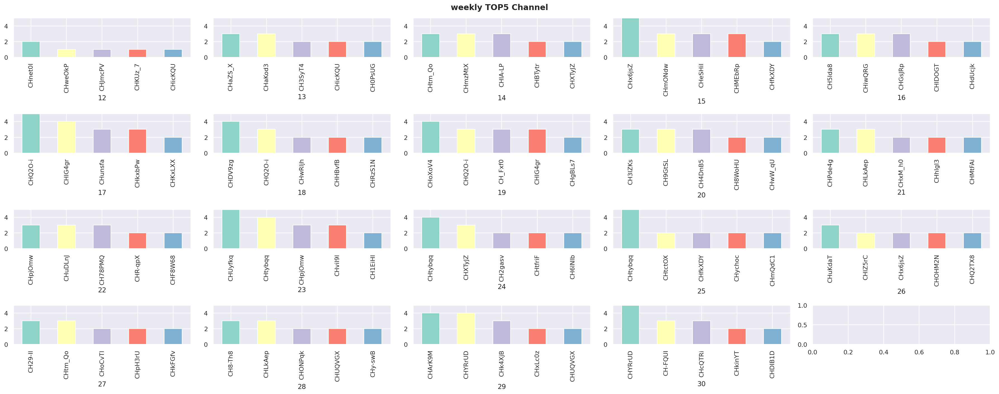

In [57]:
weekly_ch = df.pivot_table(index = [df.index.week, 'channel_id'],values = ['video_id'], aggfunc = ['count'], fill_value= 0).T
a = pd.melt(weekly_ch)
df.groupby([df.index.week, 'channel_id'])['video_id']

plt.figure(figsize = (20,7))
sns.set_palette('Set3')

fig, axes = plt.subplots(4,5, figsize = (25,10))
ax = axes.flatten()
colors = sns.color_palette('Set3')
for i in range(12,31):
    df[df.index.week == i]['channel_id'].value_counts(ascending = False).head(5).plot(kind = 'bar', ax = ax[i-12], color = colors)
    ax[i-12].set_xlabel
    ax[i-12].set_xlabel(f'{i}')
    ax[i-12].set_ylim(0,5)
    plt.suptitle('weekly TOP5 Channel',fontweight ="bold")
    plt.tight_layout()

plt.show()
    

#### 주별 TOP5 채널에 한 번 이상 올라간 영상은?
>    - 주별 TOP10 채널 중, 한 번 이상 주간 TOP5에 드는 채널 찾아보기
>>     ['CH0PsUG', 'CHQ2O-i', 'CHIG4gr', 'CHtybqq']

> -채널명    
 - SBS 세상에이런일이(entertainment) 
 - 나영석/아이슬란드에간세끼(entertainment)
 - 진용진/머니게임(people&bloga) 
 - EURO2020(sports)



In [58]:
## 주별 top5 인기 동영상에 한 번 이상 올라간 영상 채널 구하기
count_top =Counter(week_tops)

##### dict 에서 max_value 추출 방법 
## 1. max(count_top, key = count_top.get)
week_trending_chs = [k for k, v in count_top.items() if max(count_top.values()) == v]
week_trending_chs  # SBS|세상에이런일이/나영석|나PD|아간세/머니게임/EURO|EURO2020|football|tvn

['CH0PsUG', 'CHQ2O-i', 'CHIG4gr', 'CHtybqq']

In [59]:
'''
for ch in week_trending_chs:
    print(pd.DataFrame(df[df.channel_id == ch]))
'''

'\nfor ch in week_trending_chs:\n    print(pd.DataFrame(df[df.channel_id == ch]))\n'

### 5. 태그 키워드 분석

#### 월별, 카테고리별 태그 키워드 빈도 분석
 
      



In [60]:
!pip install konlpy wordcloud

In [61]:
import nltk
from konlpy.corpus import kobill
from wordcloud import WordCloud, STOPWORDS

In [62]:
## 월별 태그 키워드 순위
# 월별 카테고리별 tag 키워드를 모으고, 
month_tags = df.pivot_table(index = [df.index.month, 'category_name'],values = ['tags'],aggfunc = ['sum'],fill_value = 0)
tags = month_tags.unstack()
# 월별 카테고리별 tags dictionary 만들기(tag_month)
tag_month = {}
for i in range(0,5):
    tag_month[f'{i+3}'] = []
    for j in range(len(df.category_name.unique())):
        tag_month[f'{i+3}'].extend(str(tags.iloc[i][j]).split('|'))
#len(tag_month['3'])

#### 5-1. 월별 태그 키워드(tag keyword) 빈도 순위
*  월별 태그 키워드 분석 결과
 >     - 3월: 몰카, 웃긴영상, idol, 먹방
 >     - 4월: 먹방(mukbang), 예능, 브레이브걸스(롤린..), 몰카, 맛집
 >     - 5월: 먹방(mukbang), BTS(방탄소년단...), tvn(예능), 아이돌, 에스파, 일상, 브이로그
>      - 6월: 먹방(mukbang), 예능, 축구(손흥민, 이동국, football..), 유로2020
>      - 7월: 먹방(mukbang), 도쿄올림픽, 금메달, 런닝맨(유재석,하하..), BTS, 브이로그
 >*  공통적으로 먹방, 몰카, 일상, 브이로그는 상위 랭크, 시기에 따라 가장 유행하는 단어가 태그에 사용(브레이브 걸스, 올림픽, 유로2020..)

==============================          Month:3          ==============================


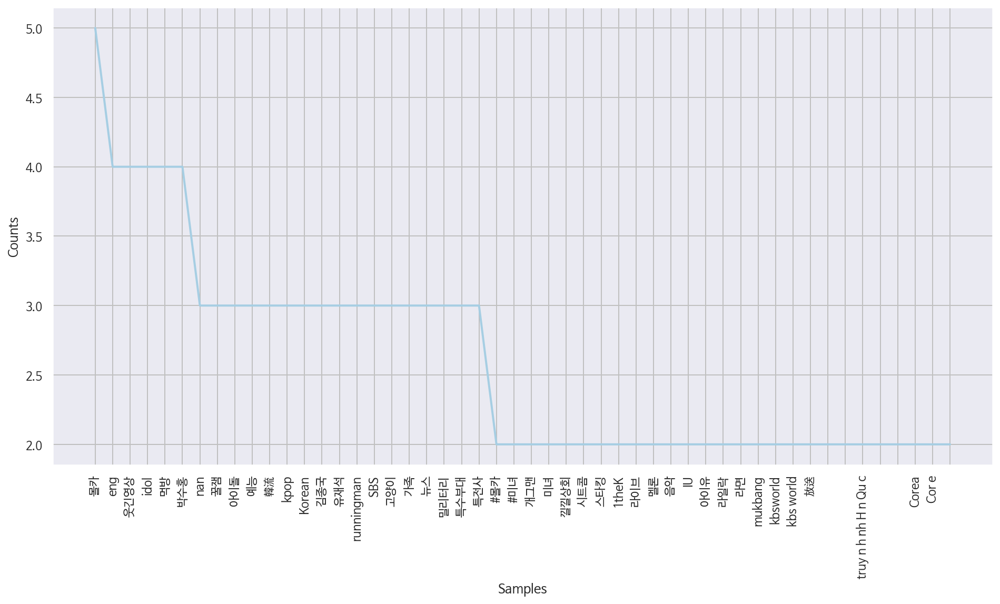

==============================          Month:4          ==============================


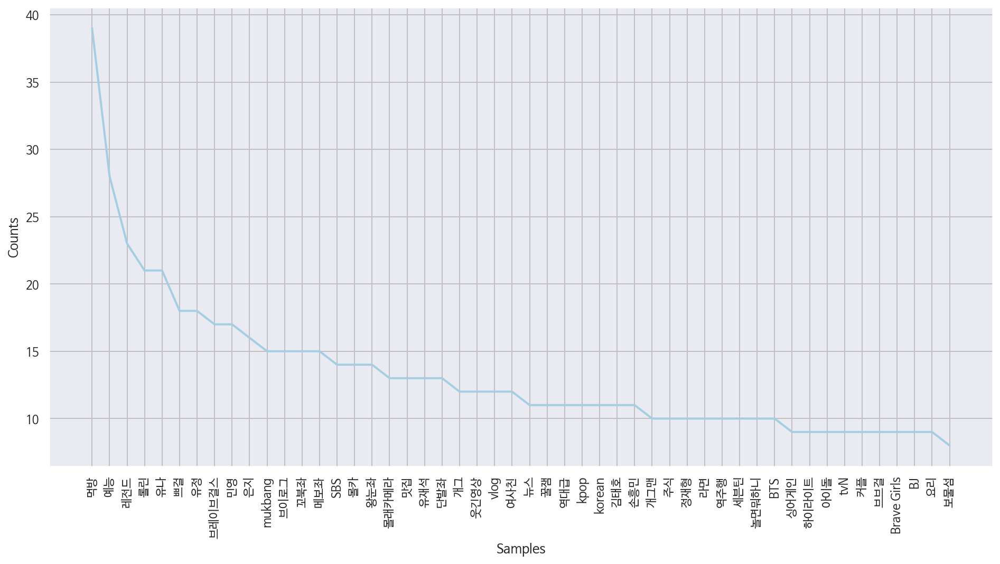

==============================          Month:5          ==============================


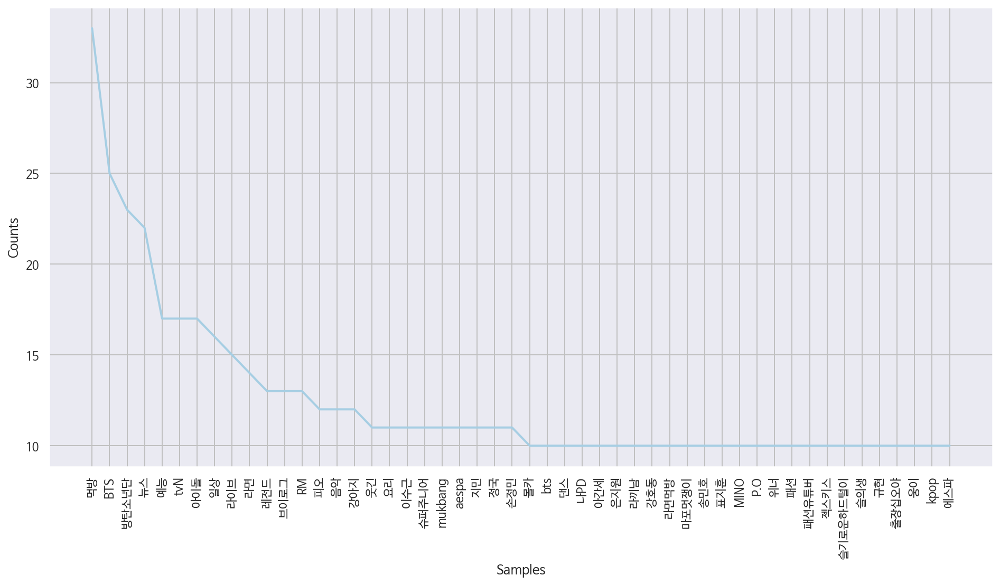

==============================          Month:6          ==============================


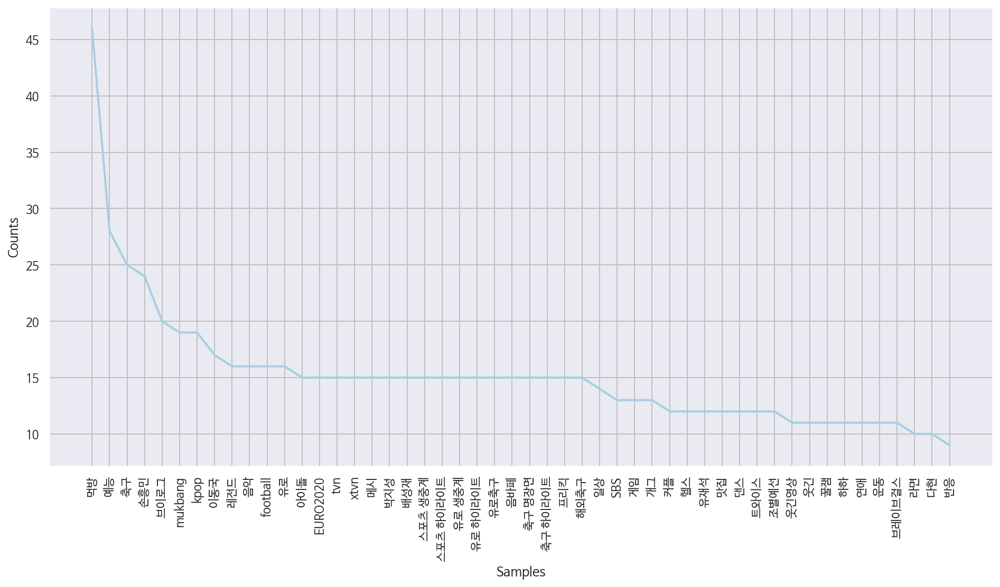

==============================          Month:7          ==============================


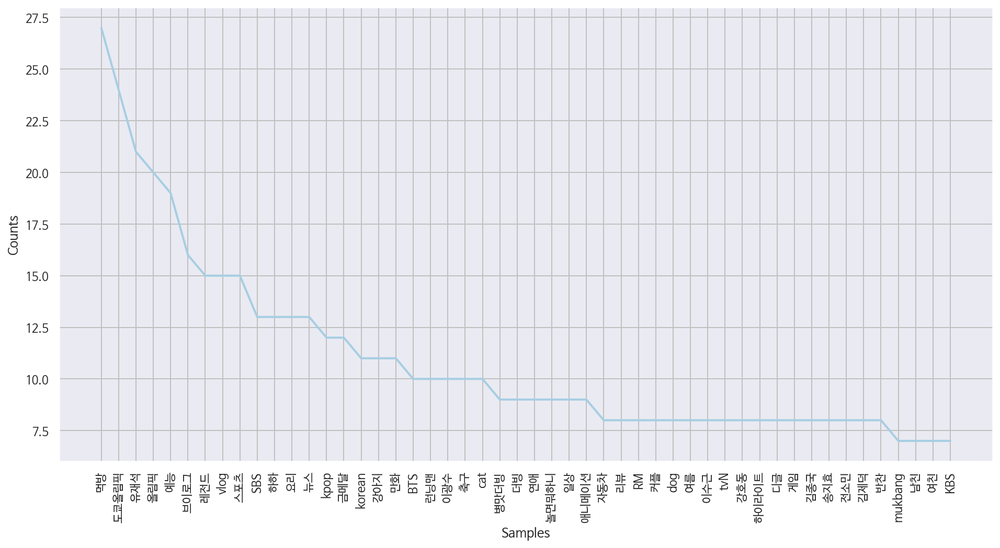

In [115]:
## 월별 tag keyword frequency 순위
for i in range(3,8):
    print("="*30+ " "*10 + f'Month:{i}' + " "*10 + "="*30)
    ko = nltk.Text(tag_month[f'{i}'], name = f"month :{i}")
    plt.figure(figsize = (16,8))
    ko.plot(50)
    plt.show()

#### 5-2. 카테고리별 태그 키워드(tag keyword) 빈도 순위
* 카테고리별 태그 키워드 분석 결과
>        - 'Autos & Vehicles': 자동차, 시승식, 블랙박스(블박, 몇대몇, 한문철..)
>        - 'Comedy': 몰카, 웃긴 영상, 반응, 음식,  영국남자(조쉬,..)
>        - 'Education': 아이템인벤토리, 드립, 유래, 어디서, 궁금증, 호기심, 주식, 조승연, 김미경
>        - 'Entertainment': 먹방, 예능, 유재석, 레전드, tvn, 놀면뭐하니, 브레이브걸스, 아이돌,.
>        - 'Film & Animation' : 만화, 더빙, 에니메이션, 웹툰, 더빙, 썰툰, 웃긴 영상 
>        - 'Gaming': 먹장, 프라이데이나이트펌틴(프나펌,..), asmr, 웃긴, 배틀그라운드, 트위치 
>        - 'Howto & Style': 반찬, 간단 요리(쉬운 요리), 한식, 3d-pen
>        - 'Music': BTS(방탄소년단, 방탄, 정국..), 음악, kpop(케이팝), 딩고(dingo), 라이브
>        - 'News & Politics' :뉴스(news), 코로나19, 경제, 주식
>        - 'Nonprofits & Activism' : x(영상이 1개)
>        - 'People & Blogs': 먹방(mukbang), 브이로그(vlog), 일상, 맛집, 자취
>        - 'Pets & Animals' : cat(고양이), dog(강아지), 동물농장, 애니뭘봐
>        - 'Science & Technology' : 애플(apple), 아이맥, 아이패드
>        - 'Sports' : 손흥민(토트넘..), 축구, 음바페, 유로2020, 메시, 
>        - 'Travel & Events' : 러시아여행, 관광, 여행       
> * 카테고리별과 빈도수가 높은 태그는 분명하며 이는 해당 카테고리를 대표하는 인기동영상이 무엇인지 나타내기도 함
>  * 해당 카테고리의 유명 인플루언서 또는 가수, 운동선수, 연예인 등이 태그에 포함되는 경우가 많음
>  *  이를 통해 사람들이 해당 카테고리에서 무엇을 선호하는지, 어떤 영상 혹은 어떤 사람이 인기인지, 무엇이 유행인지를 알 수 있음 
> * 음식, 먹방의 태그는 카테고리에 따른 영향을 덜 받는 편임

In [116]:
## 카테고리별 
month_tags = df.pivot_table(index = ['category_name',df.index.month],values = ['tags'],aggfunc = ['sum'],fill_value = 0)
cat_tags = month_tags.unstack()
tag_cat = {}
for c in cat_tags.index:
    tag_cat[c] = []
    for i in range(0,5):
        tag_cat[c].extend(str(cat_tags.loc[c][i]).split('|'))

#tag_cat['Comedy']
#cat_tags.index

==============================          category:Autos & Vehicles          ==============================


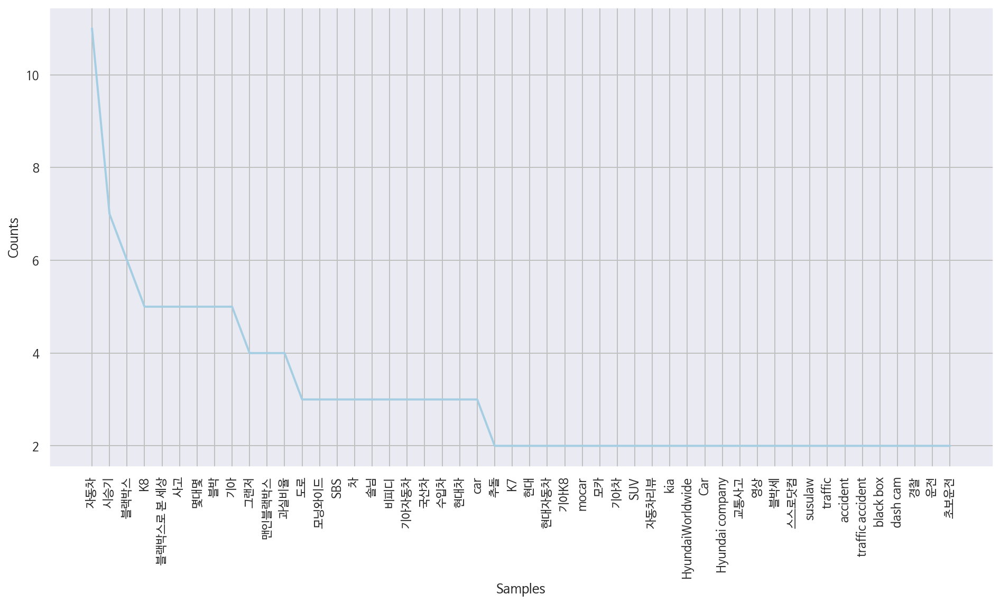

==============================          category:Comedy          ==============================


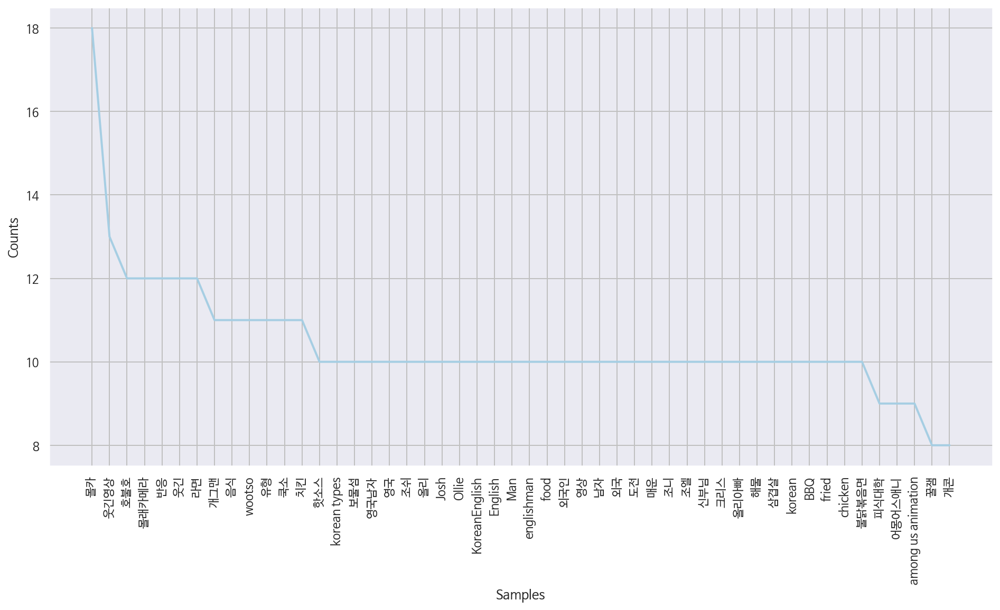

==============================          category:Education          ==============================


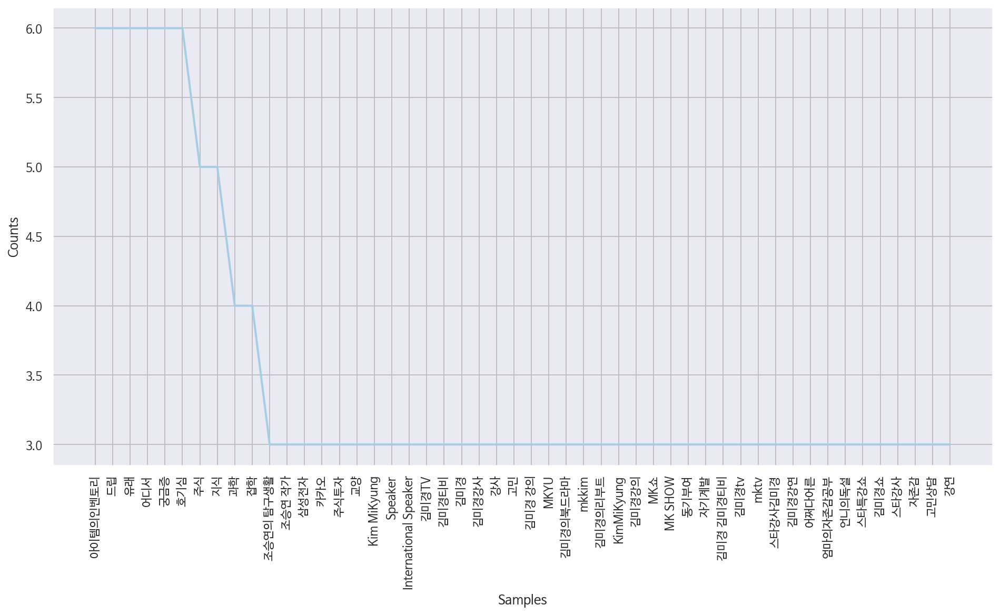

==============================          category:Entertainment          ==============================


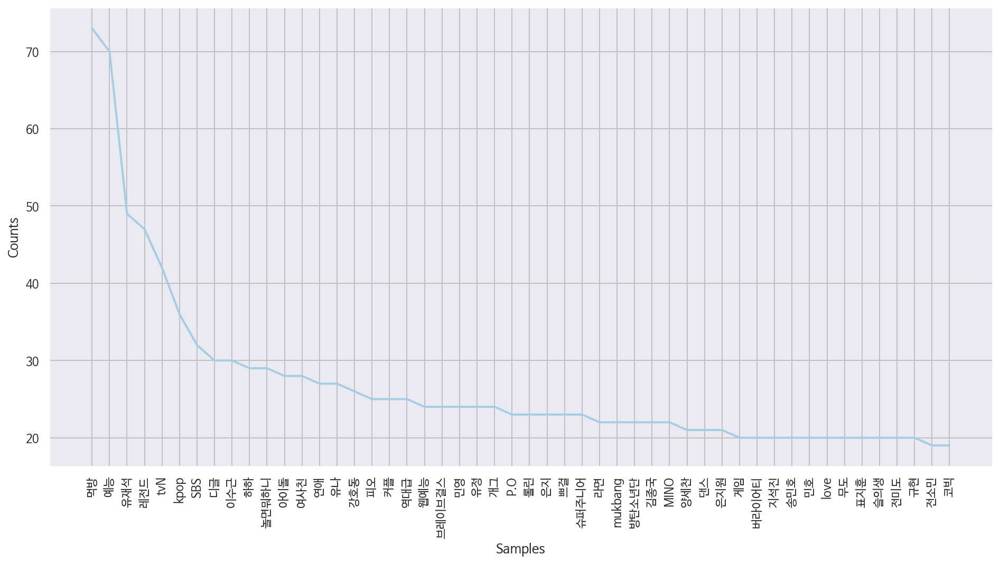

==============================          category:Film & Animation          ==============================


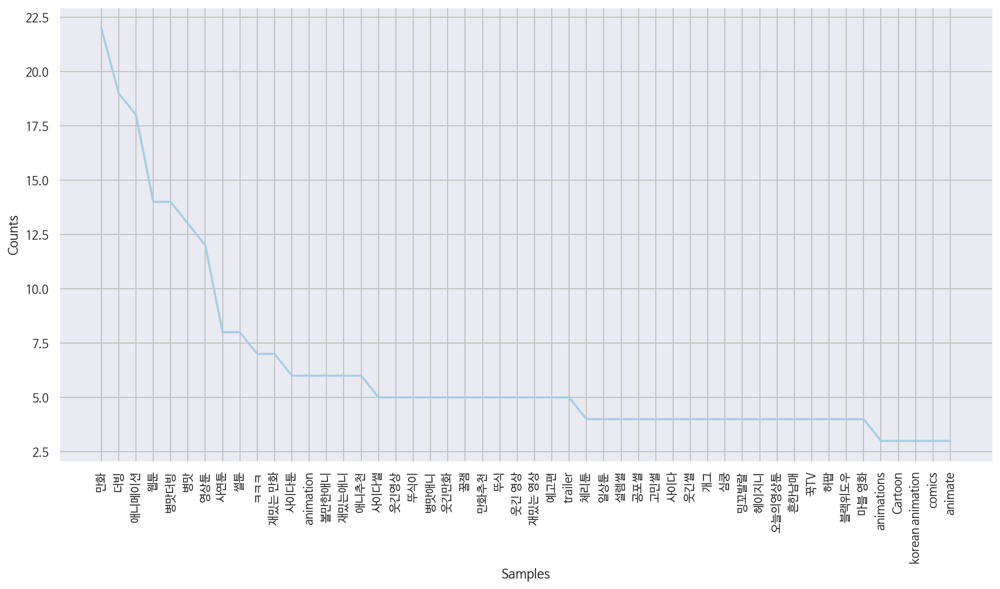

==============================          category:Gaming          ==============================


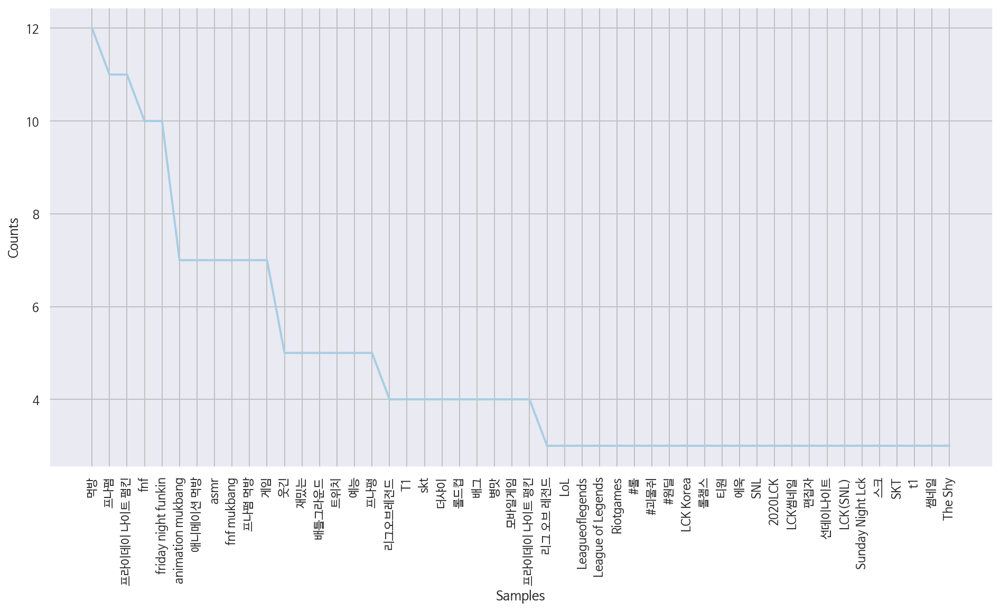

==============================          category:Howto & Style          ==============================


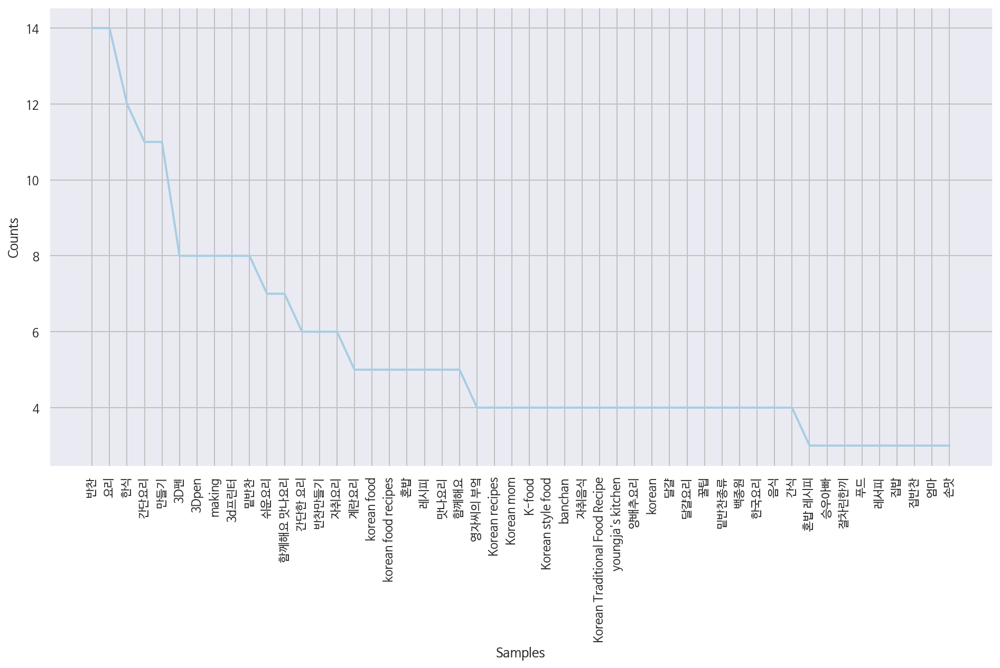

==============================          category:Music          ==============================


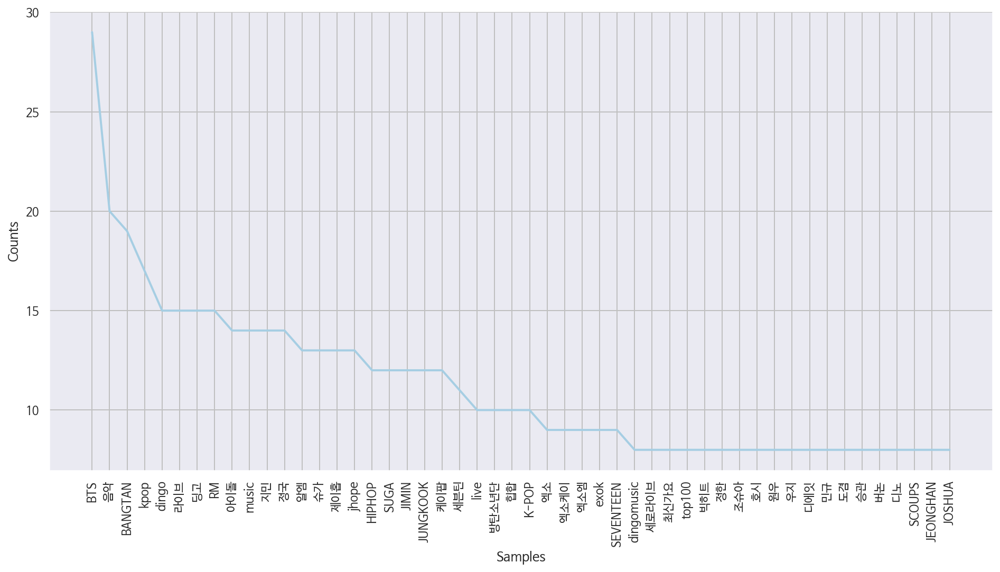

==============================          category:News & Politics          ==============================


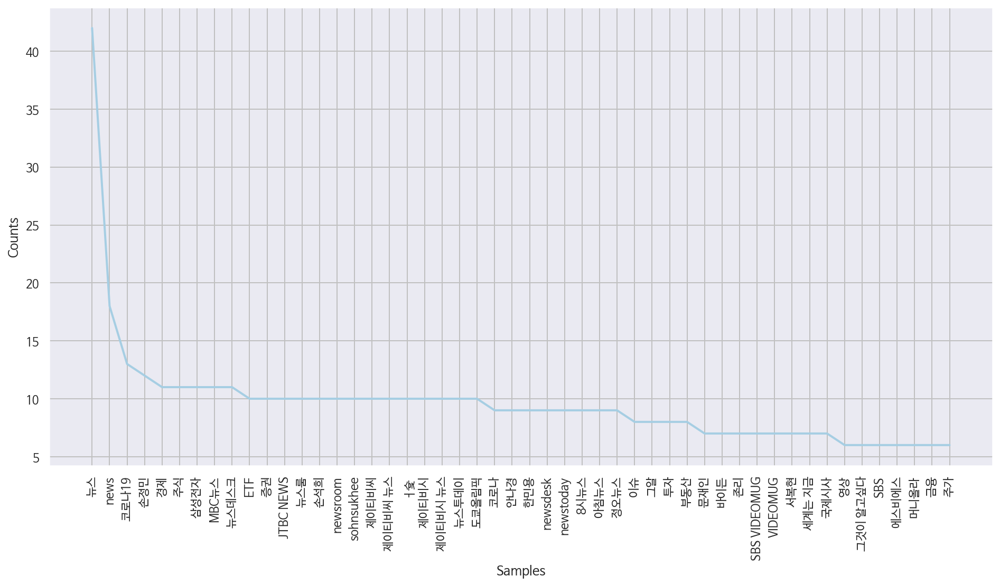

==============================          category:Nonprofits & Activism          ==============================


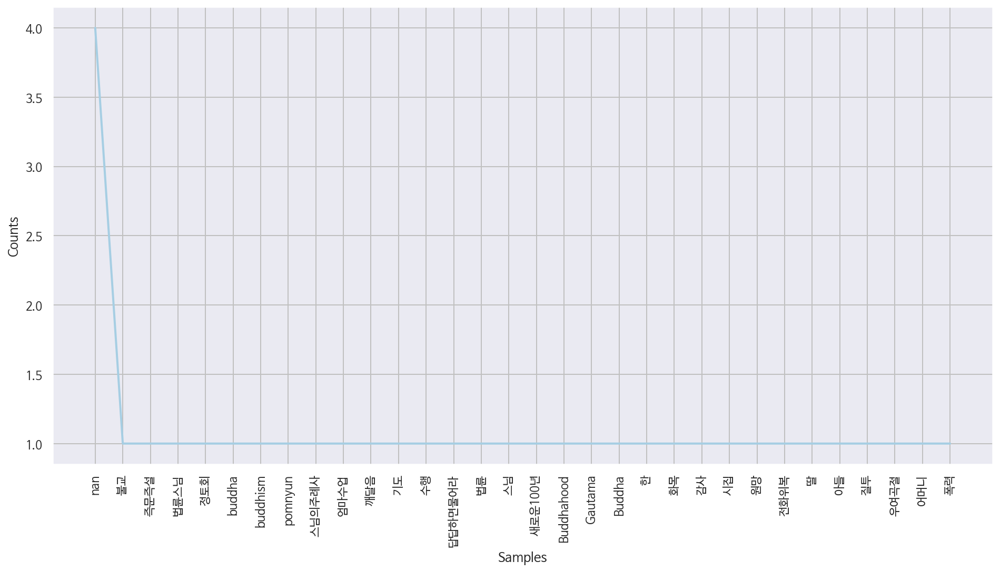

==============================          category:People & Blogs          ==============================


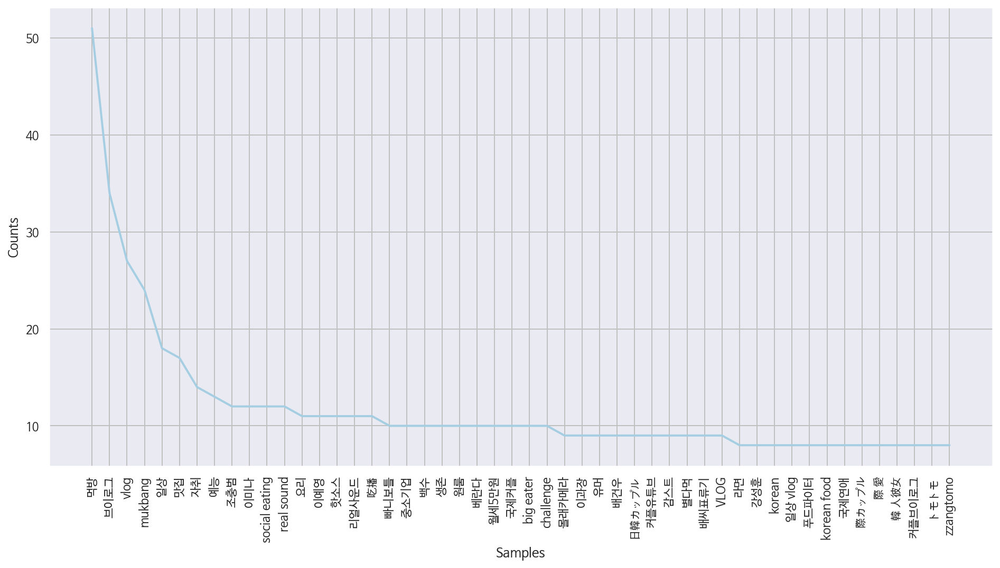

==============================          category:Pets & Animals          ==============================


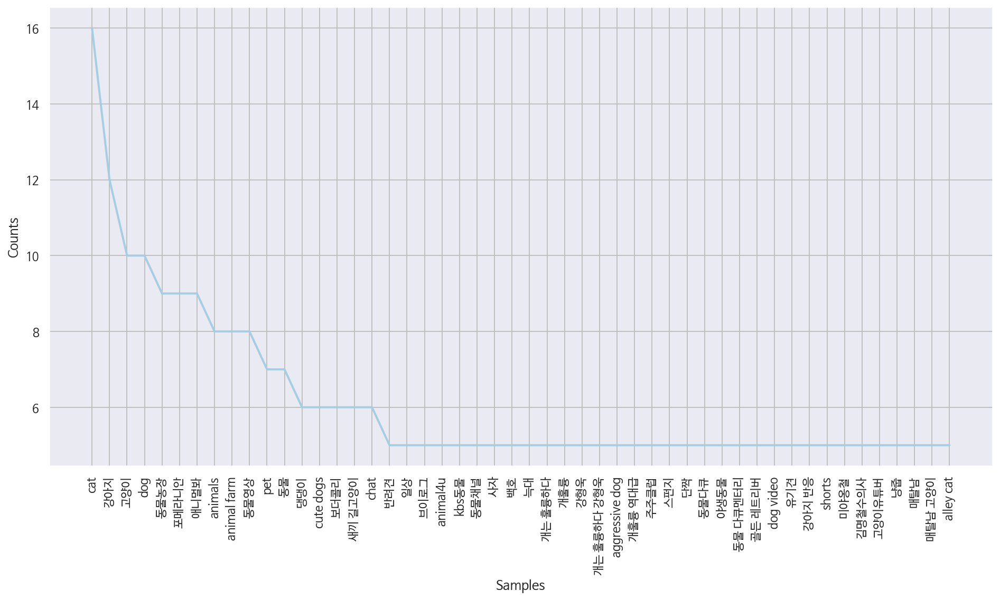

==============================          category:Science & Technology          ==============================


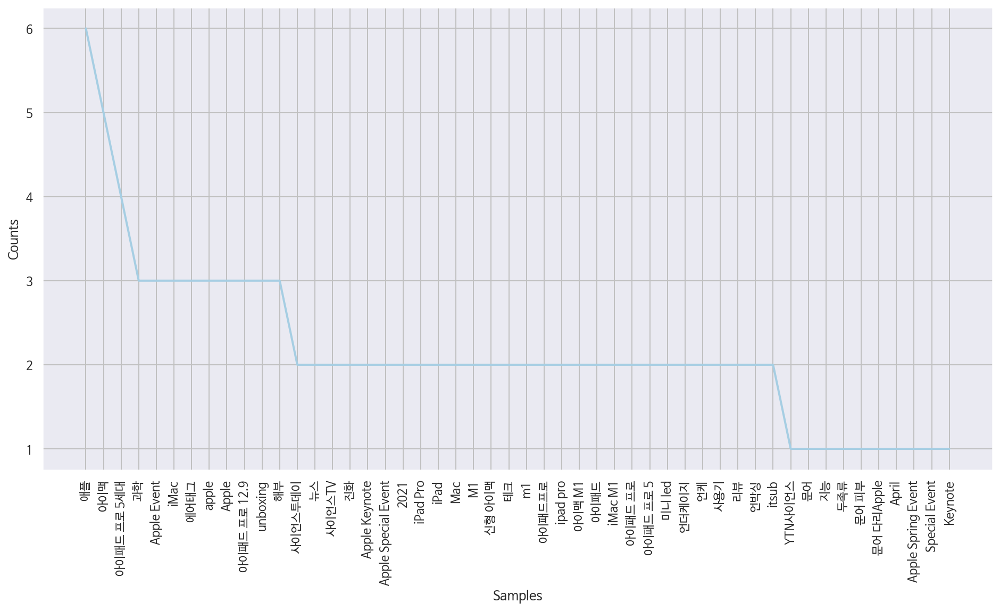

==============================          category:Sports          ==============================


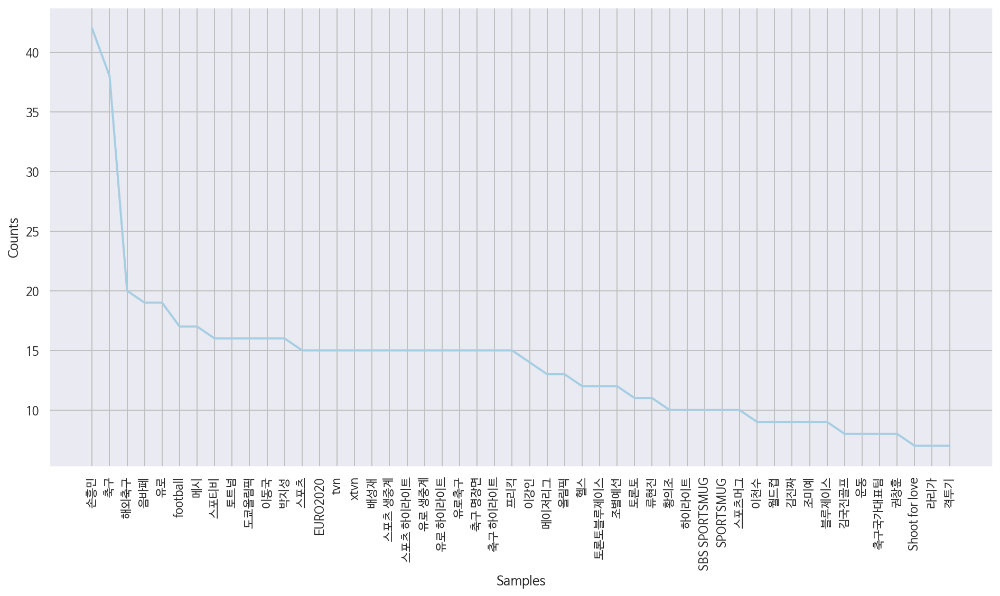

==============================          category:Travel & Events          ==============================


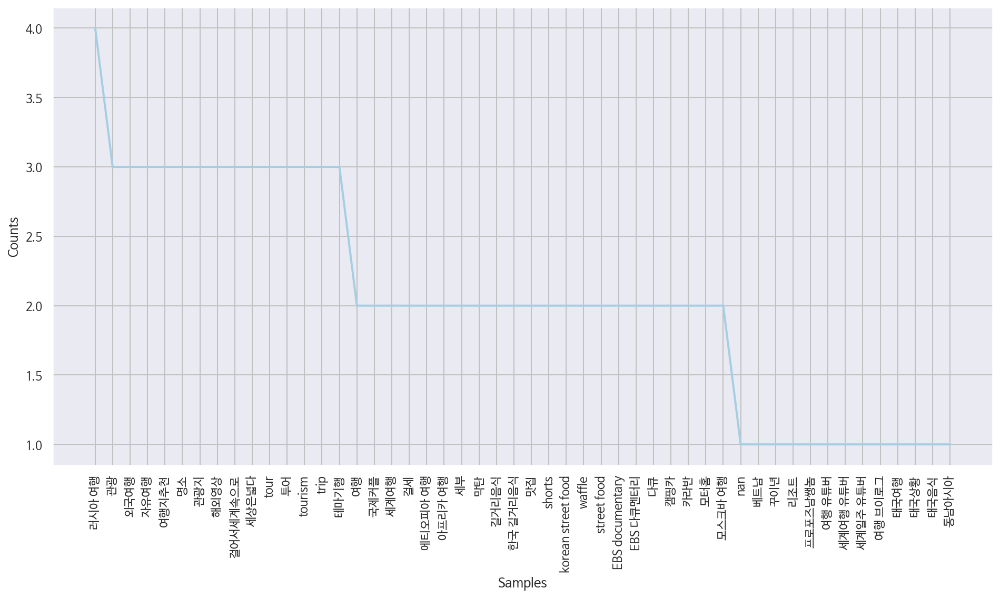

In [117]:
## 카테고리별 tag keyword frequency 순위
for c in cat_tags.index:
    print("="*30+ " "*10 + f'category:{c}' + " "*10 + "="*30)
    ko = nltk.Text(tag_cat[c], name = f"{c}")
    plt.figure(figsize = (16,8))
    ko.plot(50)
    plt.show()

## Ⅲ. 인기동영상 분류 지표 개발

### 1. 호응도(engagement) 지표 분석
- 일반적으로 인기 동영상은 조회수(on_views)가 높은 동영상으로 생각됨
    - 인기 동영상을 조회수가 높은 동영상으로 가정(on_views = "Y") 
- 호응도(engagement)를 판단할 수 있는 지표는 다음과 같음
        - like, dislike, comments, subscribers, viwes..
-① 조회수(on_views)와 다른 변수들 간의 correlation 보기
- ② 가정 
    
        - 좋아요/싫어요 수가 많을수록(higer "likes", higer "dislikes") 인기동영상에 올라갈 가능성이 높다.
        - 영상 업로드 날짜와 인기동영상에 올라간 날짜(trending_on_date)의 차이가 적을수록 인기동영상에 올라갈 가능성이 높다.
        - 평균 하루 조회수가 높을수록 인기동영상에 올라갈 가능성이 높다.
        - 영상 길이(duration)가 짧을수록 인기동영상에 올라갈 가능성이 높다.
        - 구독자수(subscribers)가 많을수록(혹은 기준 이상) 인기동영상에 올라갈 가능성이 높다
        - 카테고리별 가중치: "entertainment/music/people & blogs" 카테고리 영상일수록 인기동영상에 올라갈 가능성이 높다.
        - 카테고리별 인기동영상에 높은 빈도로 나타나는 단어를 사용할수록 인기동영상에 올라갈 가능성이 높다.
        - tags, description 긍정적일수록 인기동영상에 올라갈 가능성이 높다.

#### 1-1. 조회수(by_on_views) 분석
 * 조회수 기준으로 정렬한 경우
    * 상위 14개는 music 채널이며 이후 entertainment, comedy로 구성됨
    * 조회수의 최대값(on_viwes.max)은 97,276,666(9천만) 
    * 조회수의 최소값(on_views.min)은 0으로 이는 예외적인 경우임 
        - 구독자수: 약 190만, 40s shorts 영상 
    *  하나의 동영상을 제외하고는 조회수(on_views)는 53,000 이상임


In [118]:
#### numeric variables
df_on = df[['video_id', 'channel_id', 'category_name', 'duration', 'on_views', 'on_likes', 'on_dislikes',
           'on_comments', 'on_channel_subscribers', 'on_channel_total_views','on_channel_total_videos']]
df_on = df_on.reset_index()

In [119]:
#숫자 표현(소수 둘째자리)
pd.options.display.float_format = '{:.2f}'.format
df_on.describe()

,on_views,on_likes,on_dislikes,on_comments,on_channel_subscribers,on_channel_total_views,on_channel_total_videos
count,2644.00,2644.00,2644.00,2644.00,2644.00,2644.00,2644.00
mean,953481.91,54658.13,534.28,9032.09,1742059.08,863952463.67,9276.29
std,3200374.58,323933.71,2070.64,115532.13,5546693.71,2511739979.70,43156.37
min,0.00,0.00,0.00,0.00,0.00,55316.00,1.00
25%,235352.00,4208.50,86.00,511.00,148000.00,36982278.75,118.00
50%,427924.50,7851.00,159.00,1157.00,467000.00,121535481.50,326.50
75%,826880.00,16883.50,315.00,2720.00,1272500.00,485738584.00,1245.25
max,97276666.00,8097173.00,37349.00,4625133.00,58900000.00,21701247997.00,545577.00


In [120]:
## 인기동영상에 처음 기록된 조회수 = 0 
df_on[df_on.on_views == 0]

,published_date,video_id,channel_id,category_name,duration,on_views,on_likes,on_dislikes,on_comments,on_channel_subscribers,on_channel_total_views,on_channel_total_videos
521,2021-04-21,VhAxq,CHdq61m,Film & Animation,PT40S,0,0,0,0,1890000,363982789,80


In [121]:
on_views_df = df_on.sort_values(by = 'on_views', ascending = False)
#on_views_df.tail(15)

#### 1-2. 영상 업로드 후 인기동영상 까지 걸리는 시간 
* published_date - trending_on_date
    - 전체 91%가 업로드 후 2일 내 인기 동영상이 됨
        - 1일:6%, 2일: 85%
    - 업로드 후 5일 지난 동영상은 없음

In [122]:
df_date = df[['video_id', 'channel_id', 'category_name','on_trending_date', 'on_views', 'off_trending_date']].reset_index()
df_date['gap_date'] = df_date['on_trending_date']-df_date['published_date']

df_date['gap_date']=df_date.gap_date.dt.days
df_date.gap_date.value_counts(normalize = True)  

2   0.85
3   0.08
1   0.06
4   0.02
5   0.00
6   0.00
Name: gap_date, dtype: float64

<AxesSubplot:xlabel='gap_date', ylabel='count'>

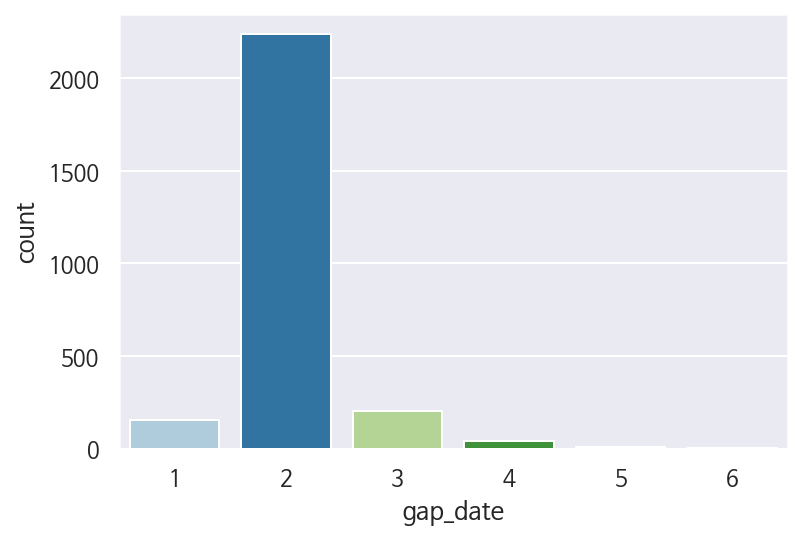

In [123]:
sns.countplot(data = df_date, x = df_date.gap_date)
#sns.displot(data = df_date, x = df_date.gap_date)

#### 1-3. 인기동영상에 머무는 시간 
* difference between on & off_trending date 
*  95%가 3일이내 트렌드에 머물다가 사라짐
    *  인기 동영상의 60%정도 1일 이내 반짝 올랐다가 사라짐
    *  4일 이상 올라간 경우

In [124]:
df_date['diff_trending_date']  = df_date['off_trending_date']-df_date['on_trending_date']

In [125]:
df_date['diff_trending_date'] = df_date['diff_trending_date'].dt.days

In [126]:
df_date['diff_trending_date'].value_counts(normalize = True)

1   0.33
0   0.28
2   0.23
3   0.11
4   0.04
5   0.01
6   0.00
7   0.00
Name: diff_trending_date, dtype: float64

In [127]:
df_date[df_date['diff_trending_date'] == 5].describe()

,on_views,gap_date,diff_trending_date
count,21.00,21.00,21.00
mean,2543816.29,2.05,5.00
std,2611517.45,0.50,0.00
min,170402.00,1.00,5.00
25%,763703.00,2.00,5.00
50%,1768257.00,2.00,5.00
75%,3414658.00,2.00,5.00
max,9661320.00,3.00,5.00


In [128]:
df_date[df_date['diff_trending_date'] == 4]

,published_date,video_id,channel_id,category_name,on_trending_date,on_views,off_trending_date,gap_date,diff_trending_date
1,2021-03-26,VaUhF,CHJmcPV,Entertainment,2021-03-28,572113,2021-04-01,2,4
2,2021-03-26,V9XSZ,CHKUz_7,People & Blogs,2021-03-28,275624,2021-04-01,2,4
3,2021-03-26,VW9AV,CHicKQU,Education,2021-03-28,1262201,2021-04-01,2,4
4,2021-03-26,VbuVi,CH7Krez,Entertainment,2021-03-28,1121118,2021-04-01,2,4
14,2021-03-28,Vu5Ab,CHlzB2i,Entertainment,2021-03-30,974133,2021-04-03,2,4
...,...,...,...,...,...,...,...,...,...
2525,2021-07-23,V8ckU,CH31-nU,People & Blogs,2021-07-26,955207,2021-07-30,3,4
2530,2021-07-23,VRSv0,CHlRNDV,Travel & Events,2021-07-25,690165,2021-07-29,2,4
2532,2021-07-23,VAvJg,CHk6bX-,Entertainment,2021-07-25,484729,2021-07-29,2,4
2540,2021-07-24,VPZoH,CHXaYpH,Entertainment,2021-07-26,318420,2021-07-30,2,4


#### 1.4. 영상길이(duration) 분석
- 인기동영상의 75%는 영상길이(duration)가 15분 이내의 영상으로 구성됨
 - 평균은 11분 내외, 중간값은 9분 이내임

- 따라서 15분 이상의 영상은 인기동영상 지표값의 가중치를 줄이는 방향으로 가야함

In [129]:
#df_on.duration.value_counts()

In [130]:
import re

def duration(x:list) -> int :
    if len(x) == 3:
        for i in range(len(x)):
            n = int(x[0])*60 + int(x[1]) + int(x[2])/60
    elif len(x) == 2:
        for i in range(len(x)):
            n = int(x[0]) + int(x[1])/60
    else: n = int(x[0])/60         
    return round(n,2)

In [131]:
df_on.duration = df_on.duration.map(lambda x: re.split('[A-Z]+', x)[1:-1])
df_on.duration
df_on.duration = df_on.duration.apply(duration)

In [132]:
## duration -분(minute)으로 변경
df_on.duration.describe() #mean: 10.51/ median:8.83/ max:106.82(1h40m)/ min:0.02
#df_on.duration.sort_values().tail(20) # 48분 이상(20개), 60분 이상(6개)

count   2644.00
mean      10.51
std        9.05
min        0.02
25%        3.85
50%        8.83
75%       14.13
max      106.82
Name: duration, dtype: float64

#### [참고] 수치형 데이터 분포 

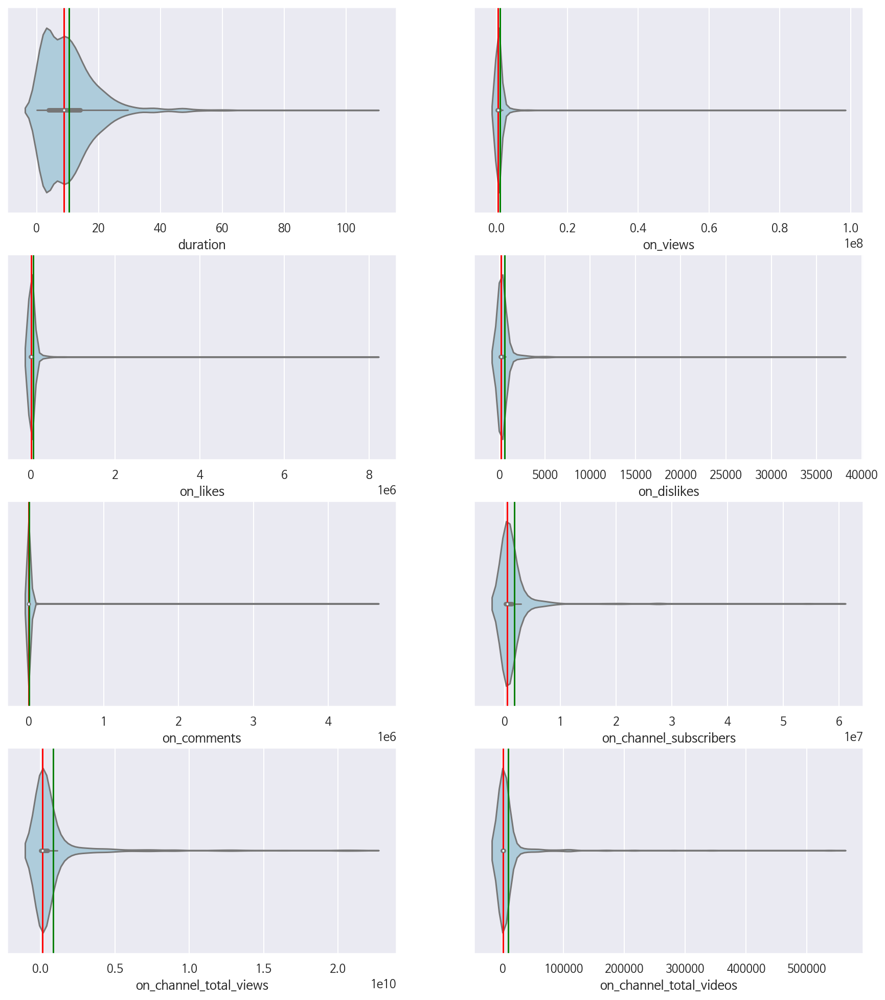

In [133]:
## numeric data distribution
sns.set_palette('Paired')
plt.figure(figsize = (15,17))
for i, col in enumerate(df_on.describe().columns):
    plt.subplot(4,2,i+1)
    sns.violinplot(x = df_on[col])
    plt.axvline(df_on[col].median(), color = 'red')
    plt.axvline(df_on[col].mean(), color = 'green')
## 전체적으로 skewed

In [134]:
df_on.describe().columns

Index(['duration', 'on_views', 'on_likes', 'on_dislikes', 'on_comments',
       'on_channel_subscribers', 'on_channel_total_views',
       'on_channel_total_videos'],
      dtype='object')

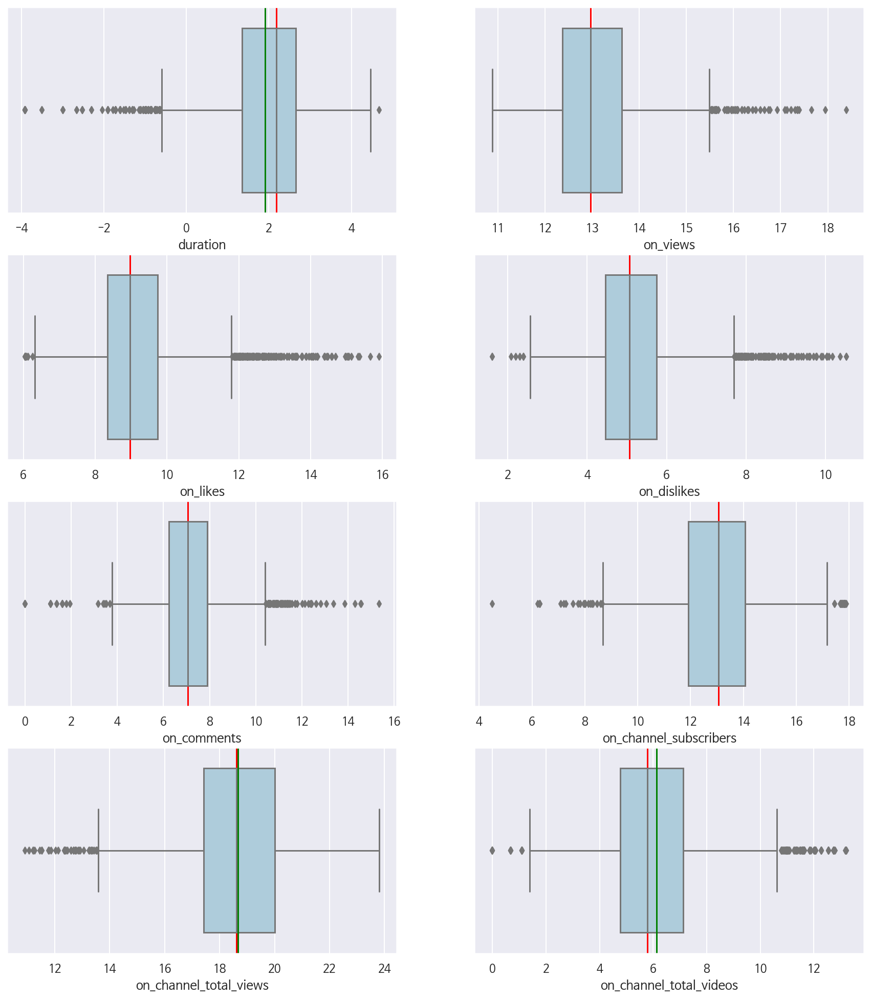

In [135]:
## numeric data distribution(log) 
plt.figure(figsize = (15,17))
for i, col in enumerate(df_on.describe().columns):
    plt.subplot(4,2,i+1)
    sns.boxplot(x = np.log(df_on[col]))
    plt.axvline(np.log(df_on[col]).median(), color = 'red')
    plt.axvline(np.log(df_on[col]).mean(), color = 'green')
    

#### 1.5. 구독자수(subscribers) 분석
 - 인기동영상의 구독자수 평균은 174만명이며 중간값은 46만7천명으로 구성됨
  - 구독자수는 이상치(5890만)의 영향을 받아 평균값이 높은편이며 60개 이상의 비디오는 구독자수가 0명이고, 최소,최대 구독자수의 편차가 심한편임
 - 따라서 구독자수 자체를 인기동영상 지표로 활용하기는 부적합함

In [136]:
df_on.on_channel_subscribers.describe()
#df_on[df_on.on_channel_subscribers == 0].tail(30)

count       2644.00
mean     1742059.08
std      5546693.71
min            0.00
25%       148000.00
50%       467000.00
75%      1272500.00
max     58900000.00
Name: on_channel_subscribers, dtype: float64

#### 1.6. 인기동영상에 오르기 전 하루 평균 조회수 분석
- 영상 업로드 후부터 인기동영상에 오르기 전까지의 (업로드 후 하루평균) 조회수를 분석
- 인기동영상은 본 영상 업로드 후 1시간 동안 평균 21,527회의 조회수를 보였으며 중간값은 8,923회로 나타남
    - 중간값을 기준으로 영상 업로드 후 시간당 10,000회의 조회수를 보인다면 인기동영상에 오를 가능성이 높다고 볼 수 있음

In [137]:
df_date['gap_hr'] = df_date['gap_date']*24
#df_date.gap_hr.value_counts()
df_date['mean_views'] = df_date['on_views']/(df_date['gap_hr'])

In [138]:
df_date.mean_views.describe()

count      2644.00
mean      21526.73
std      105434.43
min           0.00
25%        4825.10
50%        8923.31
75%       17545.20
max     4053194.42
Name: mean_views, dtype: float64

#### 1.7. 조회수와 높은 상관관계를 나타내는 지표(시각화)
        likes, dislike, commnents, subscribers

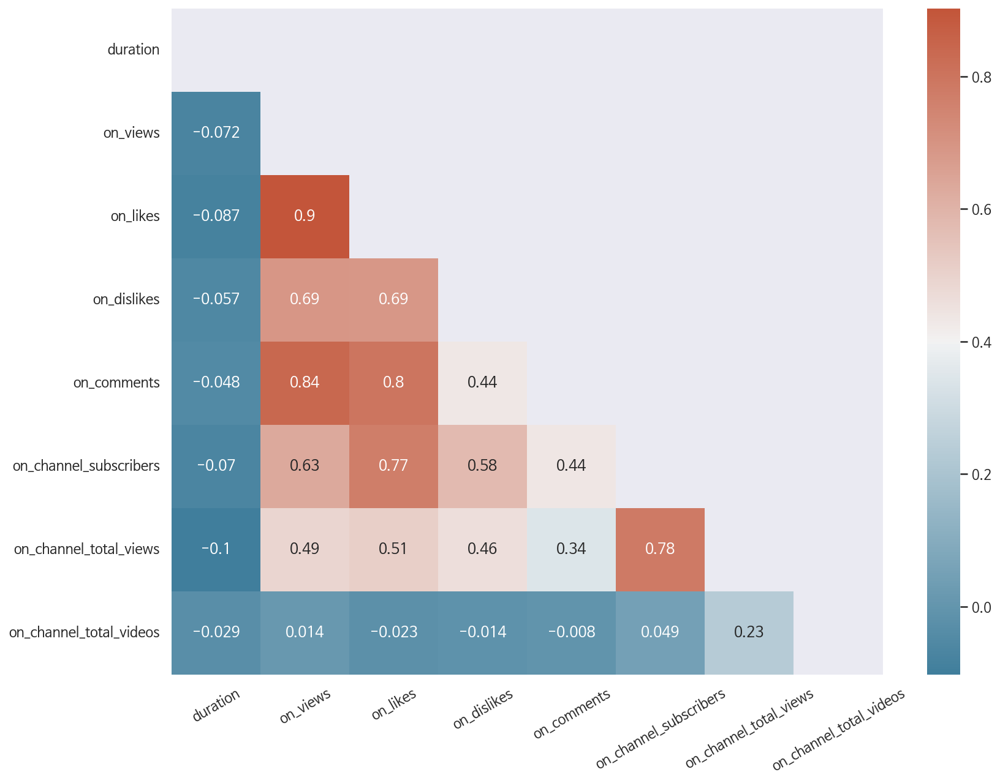

In [139]:
plt.figure(figsize = (13,10))
corr = df_on.corr()
matrix = np.triu(corr)
cmap = sns.diverging_palette(230,20,as_cmap = True)
sns.heatmap(corr, annot = True, mask = matrix, cmap = cmap)
plt.xticks(rotation = 30);

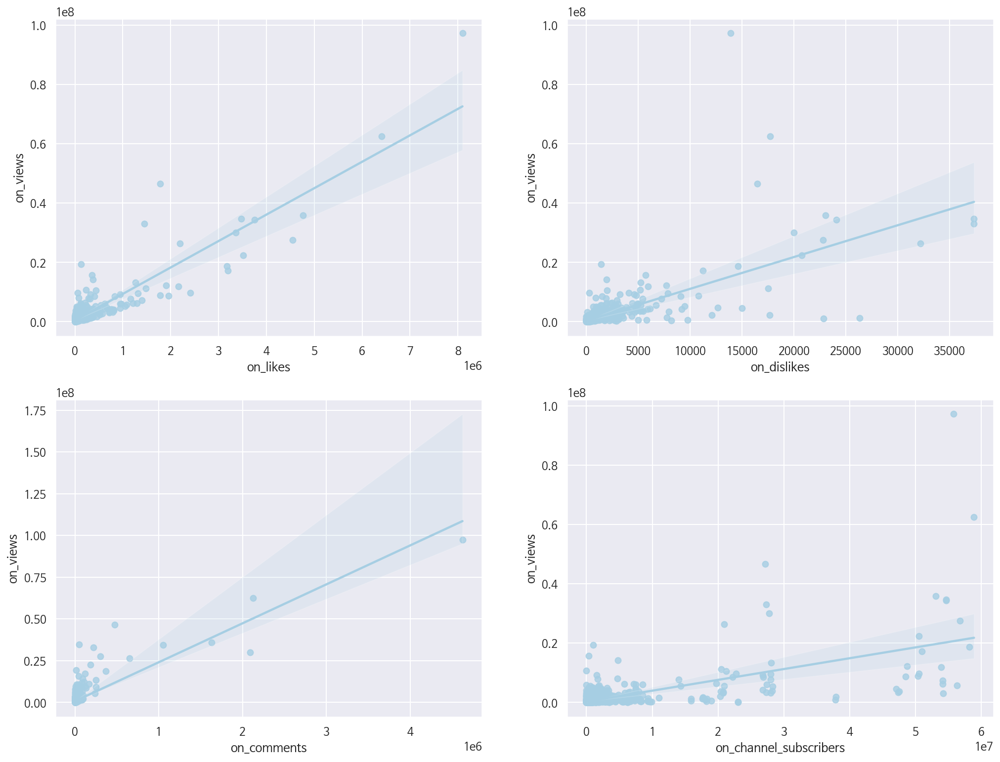

In [140]:
plt.figure(figsize = (17,13))
for i, col in enumerate(['on_likes','on_dislikes','on_comments','on_channel_subscribers']):
    plt.subplot(2,2,i+1)
    sns.regplot(x = df_on[col], y = df_on.on_views)

### 2. 인기 동영상 지표 개발
* <지표1> **조회수 대비 좋아요/싫어요 수**
    - 절대적인 좋아요/싫어요 수가 아닌 전체 조회수 대비 좋아요/싫어요 수가 많은 경우 관심도가 높은 영상으로 판단하여 인기동영상에 올라갈 가능성이 높다고 판단함
        - 또한 댓글수가 많을수록 관심이 높다고 보기 때문에 댓글수(on_commnets)를 분자게 더하여 계산할 수 있음

                (on_likes + on_dislike)/on_views
                * 분자에 +/-(on_comments) 

* <지표2> **구독자수 대비 조회수**
    - 구독자수와 조회수는 비례하지 않음
    - 채널의 구독자수가 많은 채널은 비슷한 포맷으로 반복되는 영상에 되려 식상함을 느끼기 쉬우므로, 채널 개설 후 많은 시간이 지났다면 구독자수가 많은 채널이라도 조회수가 높지 않을 가능성이 높음
    - 따라서 단순 구독자수보다는 구독자 수 대비 조회수의 비율이 높다면 인기동영상에 올라갈 가능성이 높다고 판단할 수 있음  
             on_views/on_subscribers
* <지표3> **관련지표 가중치 부여**
 - 상기에서 살펴본 수치형 변수들을 바탕으로 가중치를 부여함
        - 영상 업로드 후 2일 이내/ 카테고리(entertainment, music, people&blogs)해당 여부/ 영상길이 10분 이내(~15분 내)/ 구독자수 50만 /시간당 조회수 1만회 이상
    - 위의 기준에 만족하면 가중치 1이상, 미달이면 1이하의 값을 주는 방향으로 지표를 설정해야 함


In [141]:
cat_on_df = df_on.groupby(['category_name'])['on_views','on_likes', 'on_dislikes',
           'on_comments', 'duration','on_channel_subscribers', 'on_channel_total_views','on_channel_total_videos'].agg(['min','max','mean', 'median']).stack()
#cat_on_df

In [142]:
df_ben1 = df[['video_id', 'channel_id', 'category_name','duration','on_likes','on_dislikes','on_comments','on_rank','on_views', 'on_channel_subscribers']]

### [참고] 순위 점수(rank_ratio) 
- 조회수 대신 인기 동양성을 나타내는 변수로 활용하기 위한 것임
- 인기동영상의 가장 중요한 요건이 조회수이지만, 이는 다른 호응도(engagement)지표들과 높은 상관관계를 가지므로 종속변수로 활용하는데는 적절하지 않음
- 따라서 인기동영상 순위(on_rank)를 기준으로 순위가 높을수록 높은 점수, 낮을 수록 낮은 점수를 부여할 수 있도록 아래와 같이 변환 후 역수를 취한 값을 변수로 활용하기로 함
        on_rank/number of total_rank(=50)
    

In [143]:
#rank_ratio >> dependent variable로 사용
df_ben1['rank_ratio'] = df_ben1['on_rank'].apply(lambda x: 50/x)
df_ben1.head(3)

,video_id,channel_id,category_name,duration,on_likes,on_dislikes,on_comments,on_rank,on_views,on_channel_subscribers,rank_ratio
published_date,,,,,,,,,,,
2021-03-25,Vv7bn,CHweOkP,Entertainment,PT4M40S,825421,9096,47712,1,8553414,22200000,50.00
2021-03-26,VaUhF,CHJmcPV,Entertainment,PT13M39S,9566,228,522,5,572113,419000,10.00
2021-03-26,V9XSZ,CHKUz_7,People & Blogs,PT4M39S,15272,35,2233,19,275624,105000,2.63


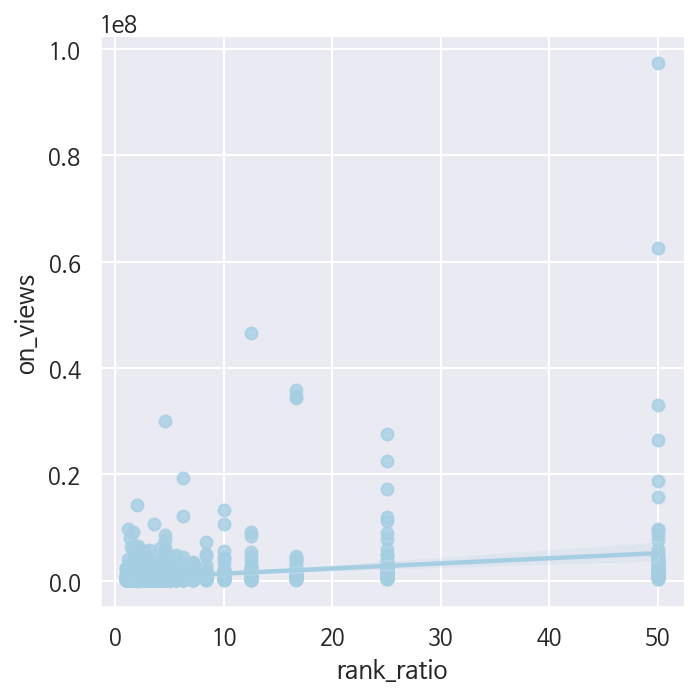

In [144]:
sns.lmplot(x = 'rank_ratio', y = 'on_views', data = df_ben1)

### 2-1. 조회수 대비 좋아요/싫어요 수 
* 댓글수를 분자에 더한 경우와 아닌 경우 그 값에 크게 차이가 나지 않음
 

                (on_likes + on_dislike)/on_views
                * 분자에 +/-(on_comments) 



In [145]:
df_ben1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2644 entries, 2021-03-25 to 2021-07-29
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   video_id                2644 non-null   object 
 1   channel_id              2644 non-null   object 
 2   category_name           2644 non-null   object 
 3   duration                2644 non-null   object 
 4   on_likes                2644 non-null   int64  
 5   on_dislikes             2644 non-null   int64  
 6   on_comments             2644 non-null   int64  
 7   on_rank                 2644 non-null   int64  
 8   on_views                2644 non-null   int64  
 9   on_channel_subscribers  2644 non-null   int64  
 10  rank_ratio              2644 non-null   float64
dtypes: float64(1), int64(6), object(4)
memory usage: 247.9+ KB


In [146]:
df_ben1['bench1'] = (df_ben1['on_likes'] + df_ben1['on_dislikes'])/df_ben1['on_views']*100
df_ben1['bench2'] = (df_ben1['on_likes'] + df_ben1['on_dislikes'] + df_ben1['on_comments'])/df_ben1['on_views']*100
df_ben1.head(3)

,video_id,channel_id,category_name,duration,on_likes,on_dislikes,on_comments,on_rank,on_views,on_channel_subscribers,rank_ratio,bench1,bench2
published_date,,,,,,,,,,,,,
2021-03-25,Vv7bn,CHweOkP,Entertainment,PT4M40S,825421,9096,47712,1,8553414,22200000,50.00,9.76,10.31
2021-03-26,VaUhF,CHJmcPV,Entertainment,PT13M39S,9566,228,522,5,572113,419000,10.00,1.71,1.80
2021-03-26,V9XSZ,CHKUz_7,People & Blogs,PT4M39S,15272,35,2233,19,275624,105000,2.63,5.55,6.36


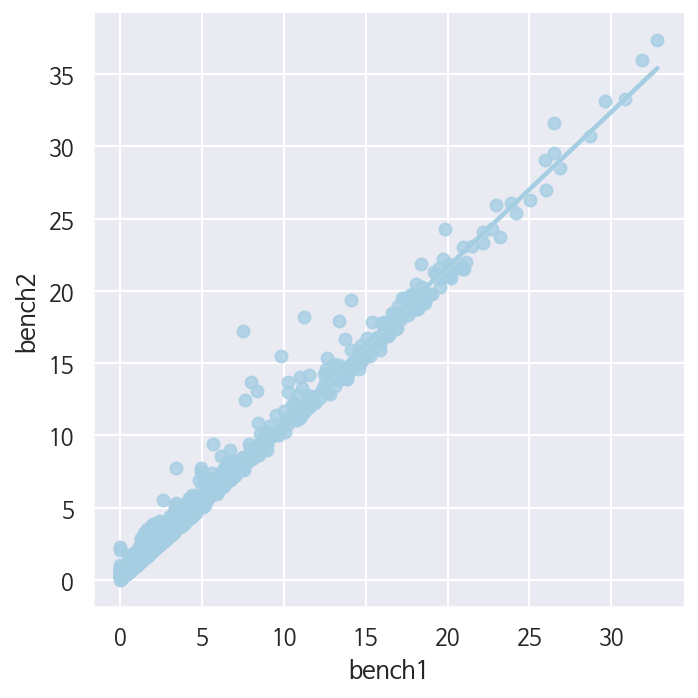

In [147]:
sns.lmplot(x = 'bench1', y = 'bench2', data = df_ben1)
## +/-comments 하기에는 bench1과 bench2가 너무 유사함 

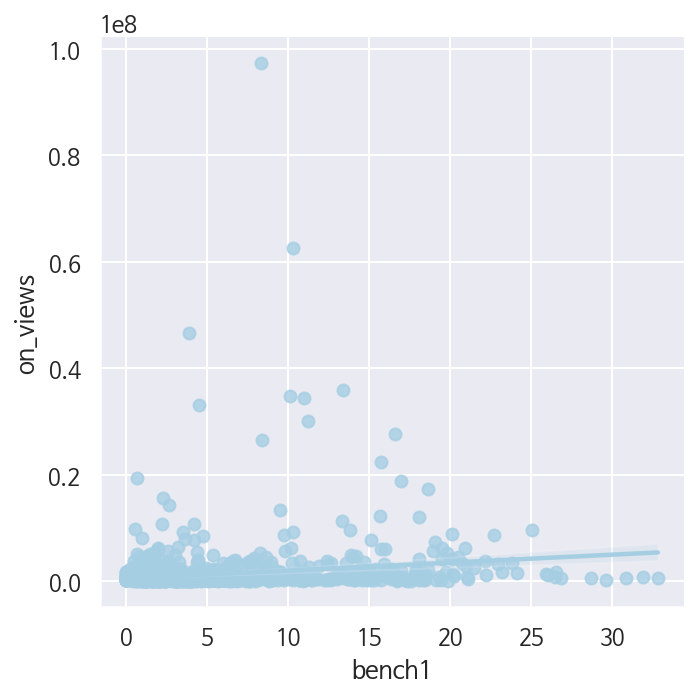

In [148]:
sns.lmplot(x = 'bench1', y = 'on_views', data = df_ben1)

### 2-2. 구독자수 대비 조회수 비율 
    - on_views/(on_subscribers+1) *100
        - 구독자수 = 0 인 경우 분모 = 0 이므로 +1
        - 100보다 클수록 구독자 대비 조회수가 높다는 의미
        - 값이 작을수록 구독자수는 많지만 조회수는 낮음


In [149]:
df_ben1['bench3'] = (df_ben1['on_views']/(df_ben1['on_channel_subscribers']+1))*100
df_ben1.head(3)

,video_id,channel_id,category_name,duration,on_likes,on_dislikes,on_comments,on_rank,on_views,on_channel_subscribers,rank_ratio,bench1,bench2,bench3
published_date,,,,,,,,,,,,,,
2021-03-25,Vv7bn,CHweOkP,Entertainment,PT4M40S,825421,9096,47712,1,8553414,22200000,50.00,9.76,10.31,38.53
2021-03-26,VaUhF,CHJmcPV,Entertainment,PT13M39S,9566,228,522,5,572113,419000,10.00,1.71,1.80,136.54
2021-03-26,V9XSZ,CHKUz_7,People & Blogs,PT4M39S,15272,35,2233,19,275624,105000,2.63,5.55,6.36,262.50


In [150]:
df_ben1['bench3'].describe()  # 편차가 너무 심함. median: 93.9

count         2644.00
mean       2109394.41
std       28077203.71
min              0.00
25%             42.51
50%             93.90
75%            244.46
max     1069837700.00
Name: bench3, dtype: float64

<AxesSubplot:xlabel='bench3'>

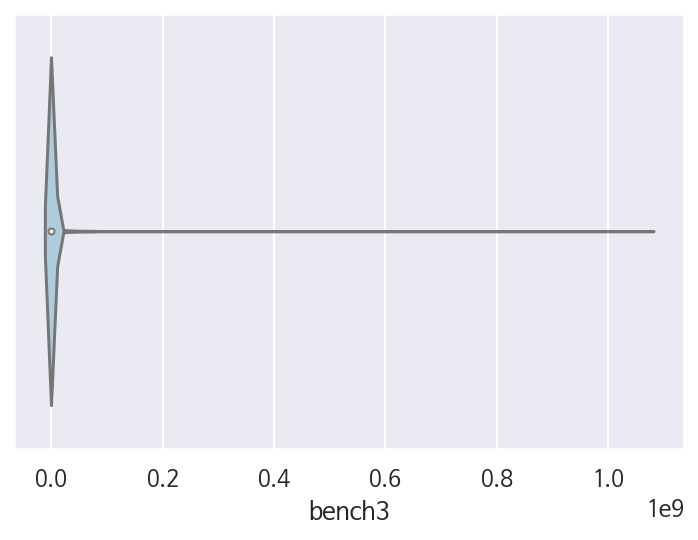

In [151]:
sns.violinplot(df_ben1['bench3'])

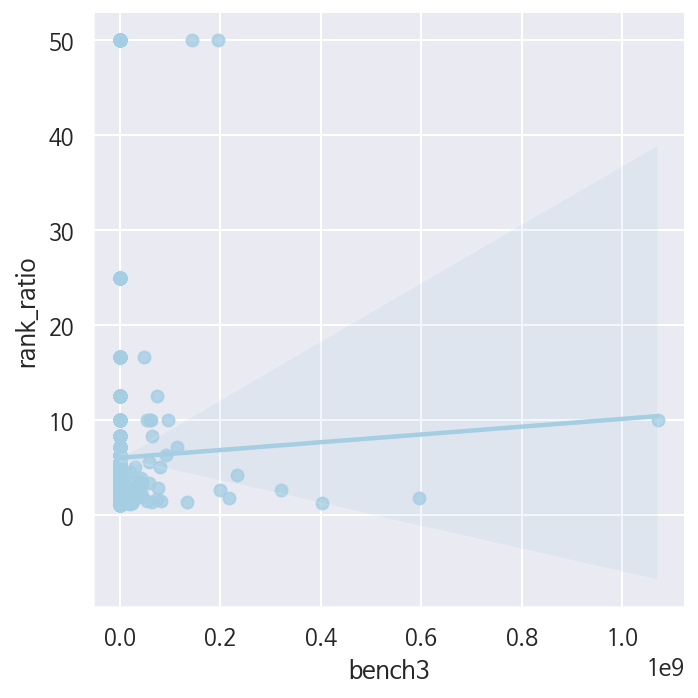

In [152]:
sns.lmplot(x = 'bench3', y = 'rank_ratio', data = df_ben1)


### 2-3. 관련지표 가중치 부여
    -  영상 업로드 후 2일 이내/ 카테고리(entertainment, music, people&blogs)해당 여부/ 영상길이 10분 이내(~15분 내)/ 구독자수 50만 /시간당 조회수 1만회 이상 
- 위의 기준에 만족하면 가중치 1이상, 미달이면 1이하의 값을 주는 방향으로 지표를 설정해야 함
    
    - ① 카테고리 가중치 부여: 인기동영상의 카테고리 비율을 기준으로 해당 카테고리에 (1+ ratio)의 가중치를 부여함
    - ② 영상길이: 인기동영상의 75%가 15분 이내의 영상이므로 15분 이상의 영상에 대해 가중치(0.75)를 부여함(15분 이상 영상길이에 대한 차등 가중치가 더욱 적절할 것 같음)
    - ③  


In [153]:
## 카테고리별 가중치 부여
cat_weight =dict(df_ben1.category_name.value_counts(normalize =True))
cat_weight
df_ben1['cat_weight'] = df_ben1['category_name'].map(cat_weight) +1
df_ben1['cat_weight'].value_counts()

1.36    954
1.16    411
1.09    234
1.08    222
1.06    167
1.06    162
1.02    130
1.05    119
1.03     80
1.03     74
1.01     36
1.01     31
1.01     23
1.00      1
Name: cat_weight, dtype: int64

In [154]:
## duration
df_ben1['duration'] = df_ben1.duration.map(lambda x: re.split('[A-Z]+', x)[1:-1])
df_ben1.duration = df_ben1.duration.apply(duration)
df_ben1.duration.describe()


count   2644.00
mean      10.51
std        9.05
min        0.02
25%        3.85
50%        8.83
75%       14.13
max      106.82
Name: duration, dtype: float64

In [155]:
df_ben1.duration.sort_values().tail(80)
## duration >= 15 이면 25% 확률이므로 0.75/ 30min~
df_ben1['dur'] = df_ben1['duration'].map(lambda x: 0.75 if x >= 15.0 else 1)

In [156]:
df_ben1['dur'].value_counts()

1.00    2052
0.75     592
Name: dur, dtype: int64

In [157]:
df_ben1.head(3)

,video_id,channel_id,category_name,duration,on_likes,on_dislikes,on_comments,on_rank,on_views,on_channel_subscribers,rank_ratio,bench1,bench2,bench3,cat_weight,dur
published_date,,,,,,,,,,,,,,,,
2021-03-25,Vv7bn,CHweOkP,Entertainment,4.67,825421,9096,47712,1,8553414,22200000,50.00,9.76,10.31,38.53,1.36,1.00
2021-03-26,VaUhF,CHJmcPV,Entertainment,13.65,9566,228,522,5,572113,419000,10.00,1.71,1.80,136.54,1.36,1.00
2021-03-26,V9XSZ,CHKUz_7,People & Blogs,4.65,15272,35,2233,19,275624,105000,2.63,5.55,6.36,262.50,1.16,1.00


#### 가설 검정


In [158]:
df_ben1.columns
df_ben2 = df_ben1[['duration', 'on_likes','dur',
       'on_dislikes', 'on_comments', 'on_rank', 'on_views',
       'on_channel_subscribers', 'rank_ratio', 'bench1', 'bench2', 'bench3',
       'cat_weight']]

In [159]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(df_ben2)
df_ben2_scaled = scaler.transform(df_ben2)

df_ben2_df_scaled = pd.DataFrame(data=df_ben2_scaled, columns=df_ben2.columns)

In [160]:
df_ben2_df_scaled

,duration,on_likes,dur,on_dislikes,on_comments,on_rank,on_views,on_channel_subscribers,rank_ratio,bench1,bench2,bench3,cat_weight
0,0.04,0.10,1.00,0.24,0.01,0.00,0.09,0.38,1.00,0.30,0.28,0.00,1.00
1,0.13,0.00,1.00,0.01,0.00,0.08,0.01,0.01,0.18,0.05,0.05,0.00,1.00
2,0.04,0.00,1.00,0.00,0.00,0.37,0.00,0.00,0.03,0.17,0.17,0.00,0.43
3,0.12,0.01,1.00,0.01,0.00,0.18,0.01,0.03,0.08,0.17,0.18,0.00,0.07
4,0.01,0.00,1.00,0.01,0.00,0.55,0.01,0.02,0.02,0.09,0.08,0.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2639,0.04,0.00,1.00,0.00,0.00,0.31,0.01,0.01,0.04,0.03,0.03,0.00,0.17
2640,0.11,0.00,1.00,0.00,0.00,0.63,0.00,0.00,0.01,0.09,0.09,0.00,1.00
2641,0.28,0.00,0.00,0.00,0.00,0.43,0.00,0.00,0.03,0.09,0.08,0.00,1.00
2642,0.10,0.00,1.00,0.01,0.00,0.90,0.00,0.02,0.00,0.05,0.05,0.00,0.43


In [161]:
df_ben2_df_scaled.corr()

,duration,on_likes,dur,on_dislikes,on_comments,on_rank,on_views,on_channel_subscribers,rank_ratio,bench1,bench2,bench3,cat_weight
duration,1.00,-0.09,-0.75,-0.06,-0.05,-0.03,-0.07,-0.07,0.04,-0.13,-0.13,-0.04,0.06
on_likes,-0.09,1.00,0.05,0.69,0.80,-0.14,0.90,0.77,0.22,0.36,0.38,0.01,-0.06
dur,-0.75,0.05,1.00,0.03,0.03,0.03,0.04,0.04,-0.05,0.08,0.09,0.02,-0.07
on_dislikes,-0.06,0.69,0.03,1.00,0.44,-0.18,0.69,0.58,0.26,0.23,0.24,0.05,-0.07
on_comments,-0.05,0.80,0.03,0.44,1.00,-0.08,0.84,0.44,0.15,0.12,0.16,0.00,-0.04
on_rank,-0.03,-0.14,0.03,-0.18,-0.08,1.00,-0.17,-0.15,-0.59,-0.02,-0.02,-0.01,-0.04
on_views,-0.07,0.90,0.04,0.69,0.84,-0.17,1.00,0.63,0.29,0.19,0.21,0.07,-0.05
on_channel_subscribers,-0.07,0.77,0.04,0.58,0.44,-0.15,0.63,1.00,0.19,0.44,0.44,-0.02,-0.02
rank_ratio,0.04,0.22,-0.05,0.26,0.15,-0.59,0.29,0.19,1.00,-0.00,0.00,0.01,0.00
bench1,-0.13,0.36,0.08,0.23,0.12,-0.02,0.19,0.44,-0.00,1.00,0.99,-0.01,-0.03


In [162]:
#from scipy.stats as stats
from statsmodels.formula.api import ols

In [163]:
ols('on_likes ~ bench1',data = df_ben2_df_scaled).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               on_likes   R-squared:                       0.131
Model:                            OLS   Adj. R-squared:                  0.131
Method:                 Least Squares   F-statistic:                     399.5
Date:                Thu, 14 Apr 2022   Prob (F-statistic):           7.02e-83
Time:                        04:18:23   Log-Likelihood:                 4943.0
No. Observations:                2643   AIC:                            -9882.
Df Residuals:                    2641   BIC:                            -9870.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0050      0.001     -5.361      0.000      -0.007      -0.003
bench1         0.1184      0.006     19.988      0.000       0.107       0.130
==============================================================================
Omnibus:                     5117.516   Durbin-Watson:                   2.021
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          9795929.448
Skew:                          14.936   Prob(JB):                         0.00
Kurtosis:                     299.750   Cond. No.                         8.25
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [164]:
ols('on_likes ~ bench2 +dur + cat_weight', data = df_ben1).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               on_likes   R-squared:                       0.148
Model:                            OLS   Adj. R-squared:                  0.147
Method:                 Least Squares   F-statistic:                     152.5
Date:                Thu, 14 Apr 2022   Prob (F-statistic):           3.78e-91
Time:                        04:18:23   Log-Likelihood:                -37074.
No. Observations:                2643   AIC:                         7.416e+04
Df Residuals:                    2639   BIC:                         7.418e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.941e+04   7.52e+04      0.258      0.796   -1.28e+05    1.67e+05
bench2      2.823e+04   1347.218     20.951      0.000    2.56e+04    3.09e+04
dur         5.857e+04   5.62e+04      1.042      0.297   -5.16e+04    1.69e+05
cat_weight -1.048e+05   4.19e+04     -2.501      0.012   -1.87e+05   -2.26e+04
==============================================================================
Omnibus:                     5064.093   Durbin-Watson:                   2.027
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          9264323.465
Skew:                          14.598   Prob(JB):                         0.00
Kurtosis:                     291.571   Cond. No.                         91.4
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## 결과 
* 인기 동영상에 오르기 위해서는 고려되어야 하는 요인들이 다양함 

* 시기적인 이슈에 영향을 많이 받으므로 따라서 카테고리별로 해당 이슈와 연관지어야 함
    - 예: 올림픽, 선거, 게임/음반 출시, 김장, 장마 등
- 시기적인 요소에 크게 영향을 받지 않는 카테고리는 people, entertainment, music
    - 상기는 이슈에 민감하지 않고 무난한 성공률을 보이는 카테고리


## 한계점
- 제한된 데이터로 인기 동영상 지표를 개발하는데는 한계점이 존재함

- 태그(tags), 설명(description)의 긍부정분석을 통해 인기동영상에 포함된 영상은 어떤 성격을 보이는지도 함께 고려하면 좋을 것 같음 

- 이외 고려해볼만한 데이터
    - 채널(계정) 생성 시기
        - 신규계정의 경우, 카테고리, 태그, 영상시간등을 고려하여 알고리즘에 의해 인기동영상에 올라갈 가능성이 높을수도 있음
        - 이 경우, 신규계정에 가중치 + 
